# Subclustering of mesoderm in NK-data

In [1]:
#loading packages
library(Seurat)
library(ggplot2)
library(magrittr)
library(data.table)
library(Matrix)
library(dplyr)
library(tibble)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
#loading data
seu_HQC <- readRDS(file = '../../data/seurat_object/NK-data/seu_HQC_NK.obj')
seu_HQC

An object of class Seurat 
24184 features across 1592 samples within 2 assays 
Active assay: SCT (10063 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


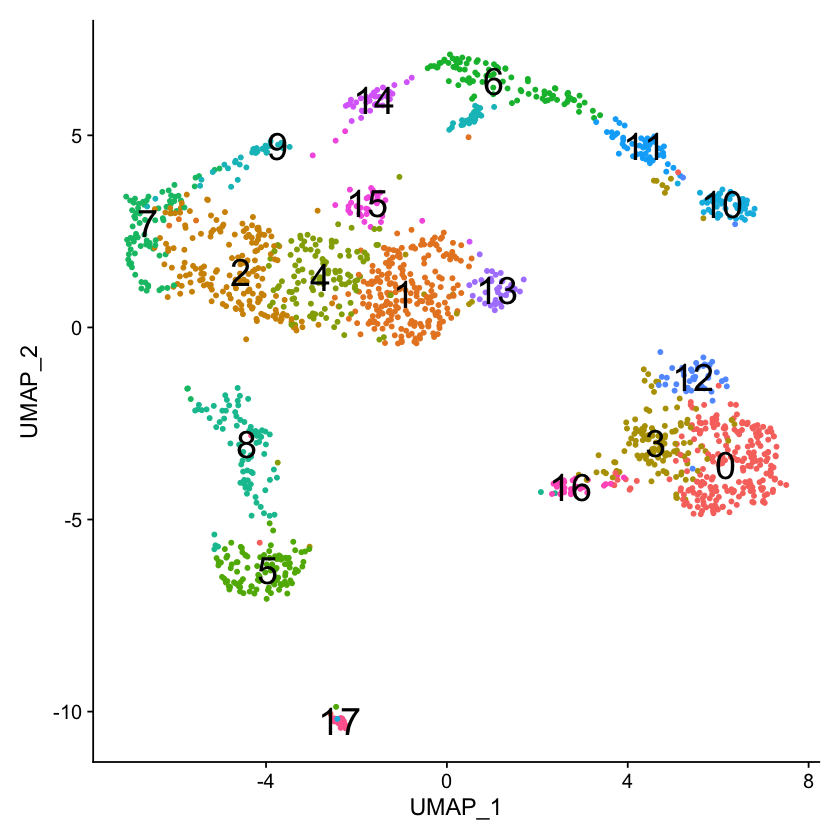

In [3]:
DimPlot(seu_HQC, reduction = 'umap', label = TRUE, label.size = 8) + NoLegend()

## Trunk mesoderm
### picking up target clusterss

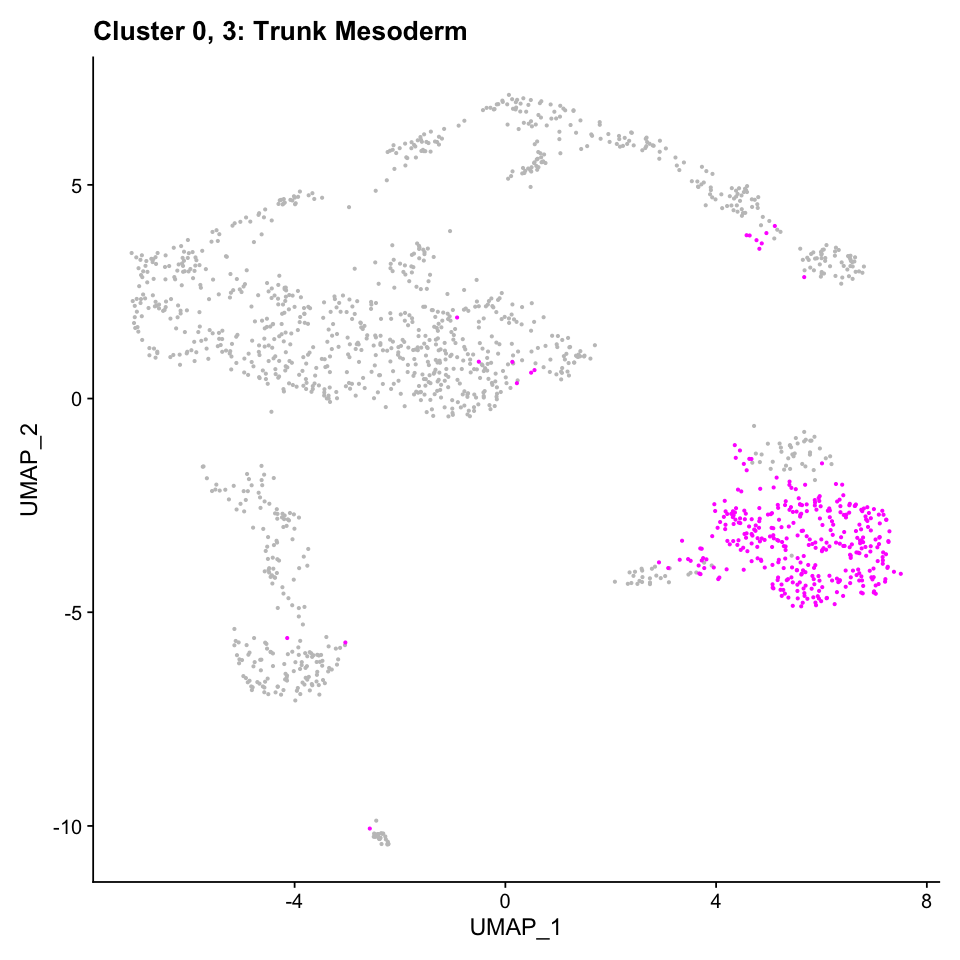

In [4]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(0,3))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Cluster 0, 3: Trunk Mesoderm')

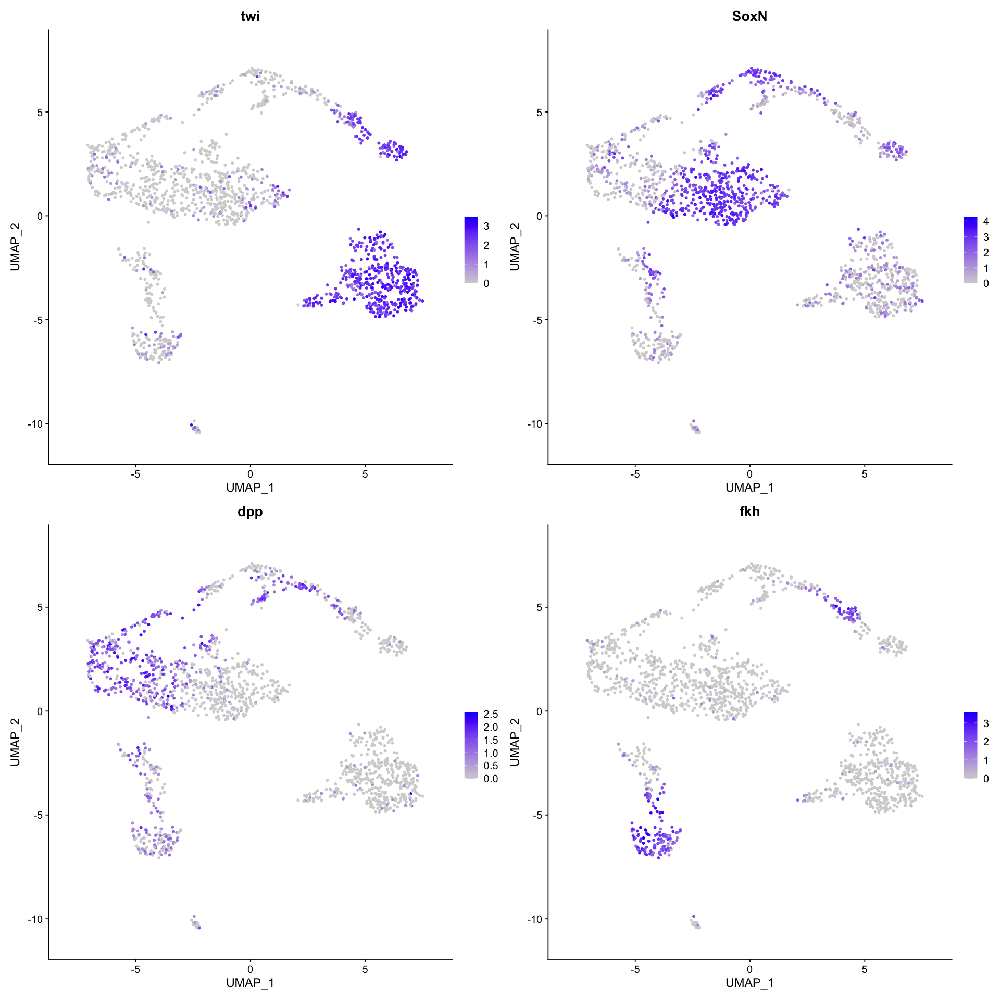

In [5]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, features = c('twi','SoxN','dpp','fkh'))

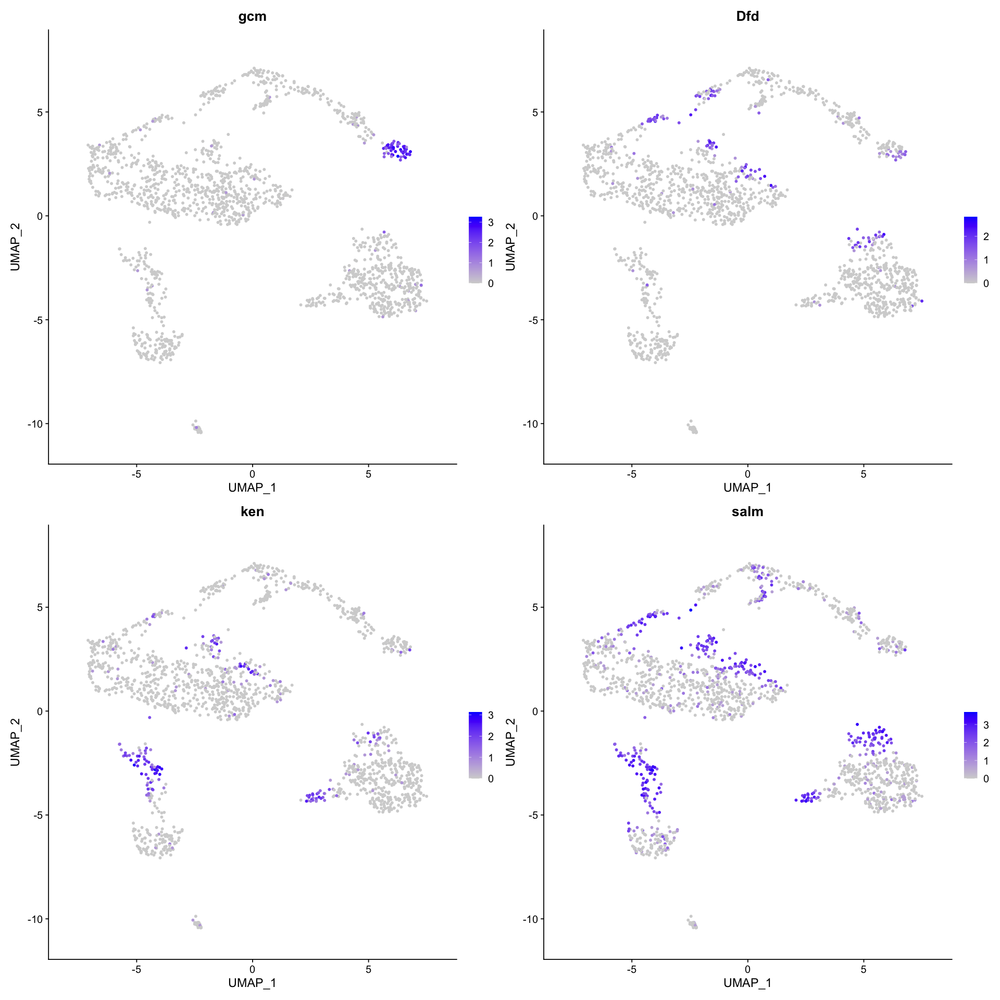

In [6]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, features = c('gcm','Dfd','ken','salm'))

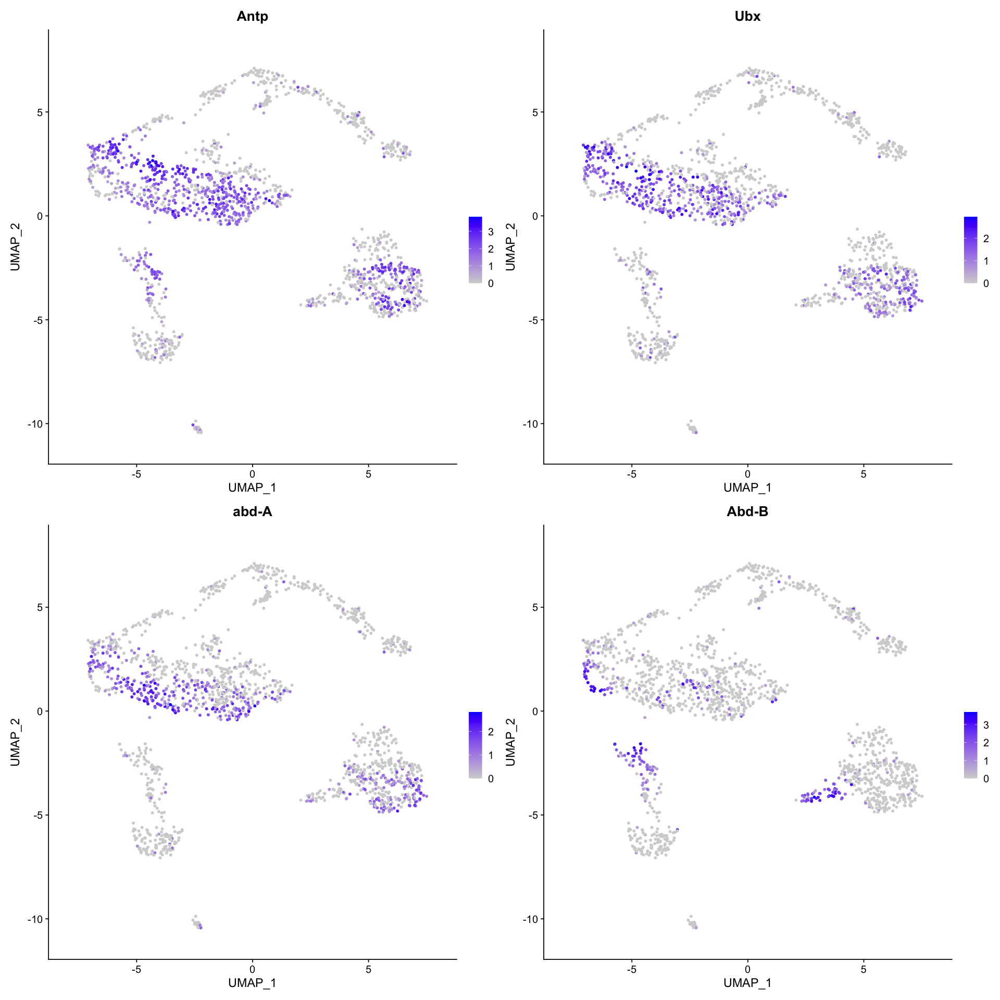

In [7]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, features = c('Antp','Ubx','abd-A','Abd-B'))

In [8]:
seu.trunk.meso <- subset(seu_HQC, ident = c(0,3))
seu.trunk.meso

An object of class Seurat 
24184 features across 360 samples within 2 assays 
Active assay: SCT (10063 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### Clustering
Num of cells < 500  
Skippping re-normalize

PC_ 1 
Positive:  CG13427, Lac, CG34224, CG15628, Tom, SoxN, CG5059, Atx-1, sdt, ths 
	   Ptr, Dl, Brd, sog, kek1, E(spl)m4-BFM, ASPP, grh, aop, cv-2 
	   CG10035, ImpL2, 5-HT2A, Pino, bib, D, Ppa, blot, rho, Doc1 
Negative:  Ilp4, twi, hll, sna, VepD, Cyp310a1, CG3036, CG12177, CadN, Act87E 
	   CG14688, Mes2, CG16758, tin, zfh1, Mef2, stumps, htl, Nplp2, lncRNA:CR45361 
	   if, stg, sty, sprt, Pka-C3, CG9005, Asph, Ama, tkv, ltl 
PC_ 2 
Positive:  wech, Myc, hth, Imp-CR45204, zfh1, mt:CoI, trn, CadN, sty, spen 
	   lncRNA:roX1, CG9005, fax, if, l(3)neo38, mt:ATPase6, CycE, Tis11, Trf2, ed 
	   chrb, Pka-C3, Glut4EF, mnb, fs(1)h, asRNA:CR45874, pAbp, stg, mthl1, CG3036 
Negative:  RpLP1, RpS20, RpS29, RpL27A, RpL21, RpL10, RpS26, RpS3A, RpL15, RpS16 
	   RpS15, CG43355-sala, RpS8, RpLP0, RpLP2, lncRNA:CR43887, Tctp, RpS18, RpS25, RpL27 
	   wntD, RpL41, RpS2, RpL10Ab, RpL37A, Ilp4, Nplp2, sta, CG12177, CG14111 
PC_ 3 
Positive:  nub, lncRNA:bxd, lncRNA:iab4, Desat1, lncRNA:iab8, CG427

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 360
Number of edges: 19300

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.3839
Number of communities: 3
Elapsed time: 0 seconds


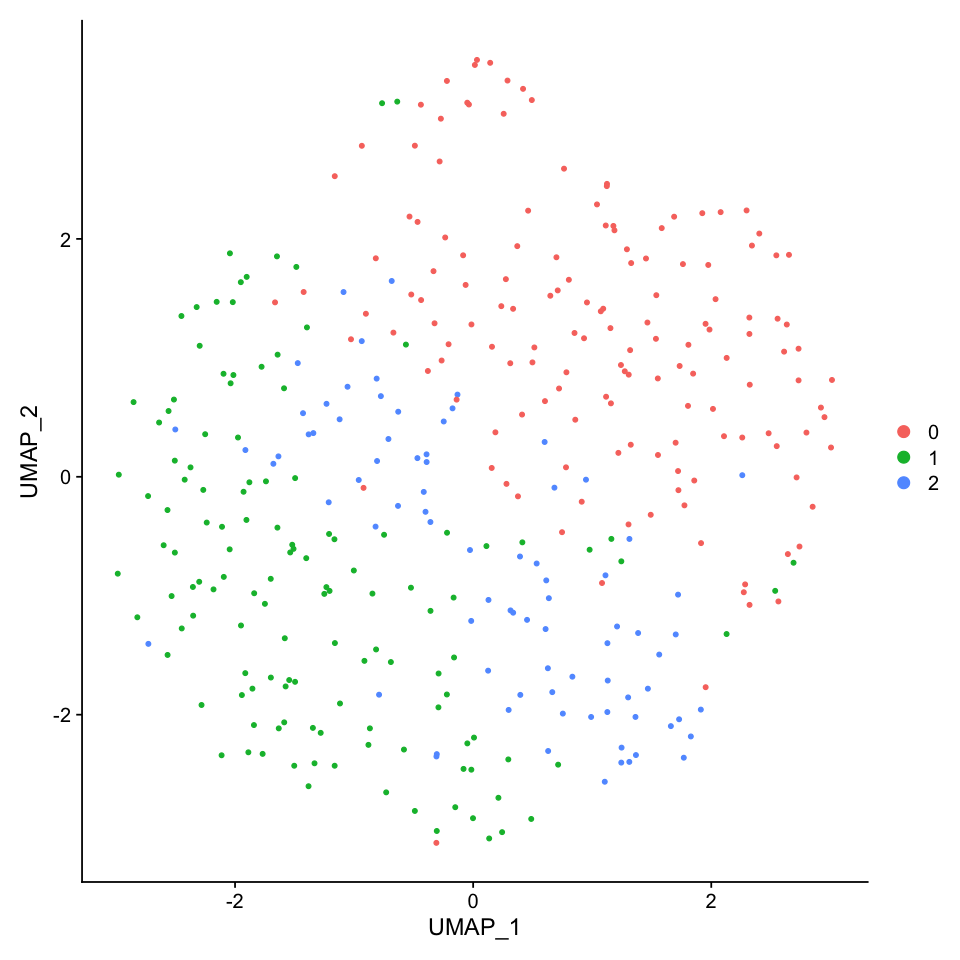

In [9]:
options(repr.plot.width=8, repr.plot.height=8)
seu.trunk.meso <- RunPCA(seu.trunk.meso)
seu.trunk.meso <- RunUMAP(seu.trunk.meso, dims = 1:30)
seu.trunk.meso <- FindNeighbors(seu.trunk.meso, dims = 1:30)
seu.trunk.meso <- FindClusters(seu.trunk.meso)
DimPlot(seu.trunk.meso, reduction = 'umap')

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 360
Number of edges: 19300

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.3169
Number of communities: 5
Elapsed time: 0 seconds


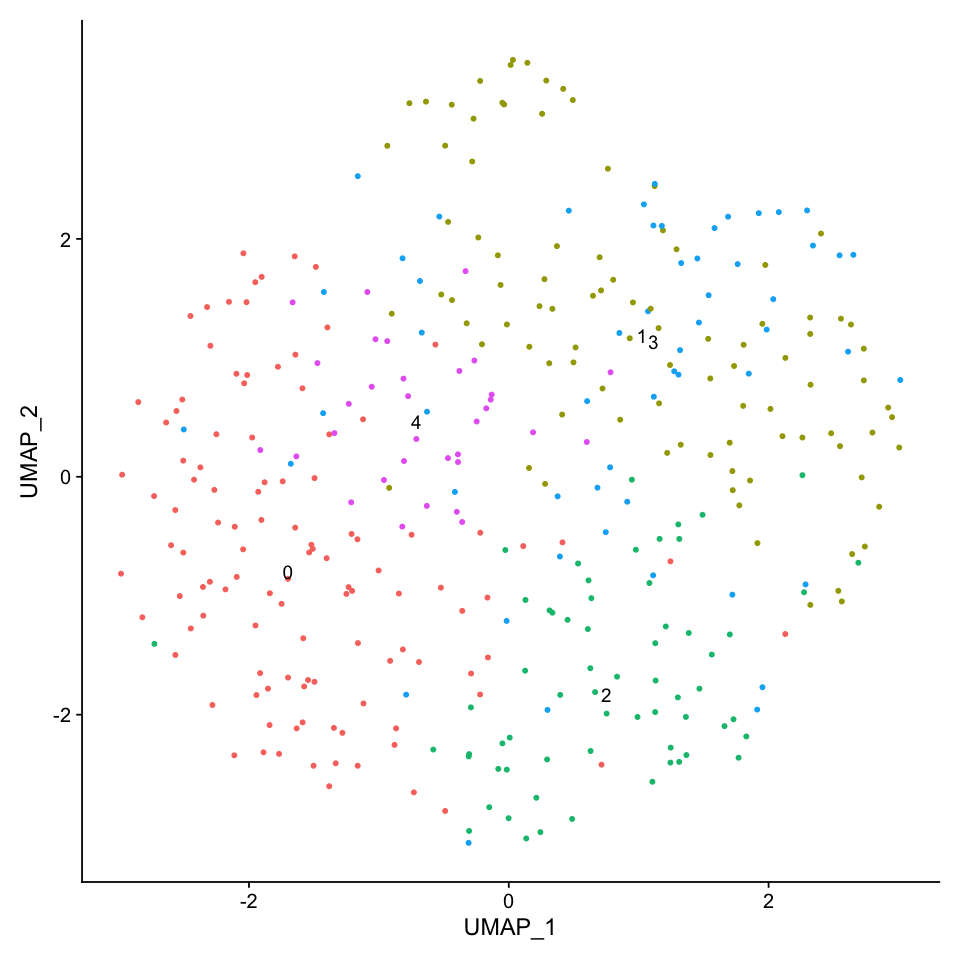

In [10]:
options(repr.plot.width=8, repr.plot.height=8)
seu.trunk.meso <- FindClusters(seu.trunk.meso, resolution = 1.0)
DimPlot(seu.trunk.meso, reduction = 'umap', label = TRUE) + NoLegend()

In [11]:
all.markers <- FindAllMarkers(object = seu.trunk.meso, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4



[1] 373

[1] 45

Warning message in DoHeatmap(seu.trunk.meso, features = c(all.markers.top10$gene)):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: DENR, CG11882”


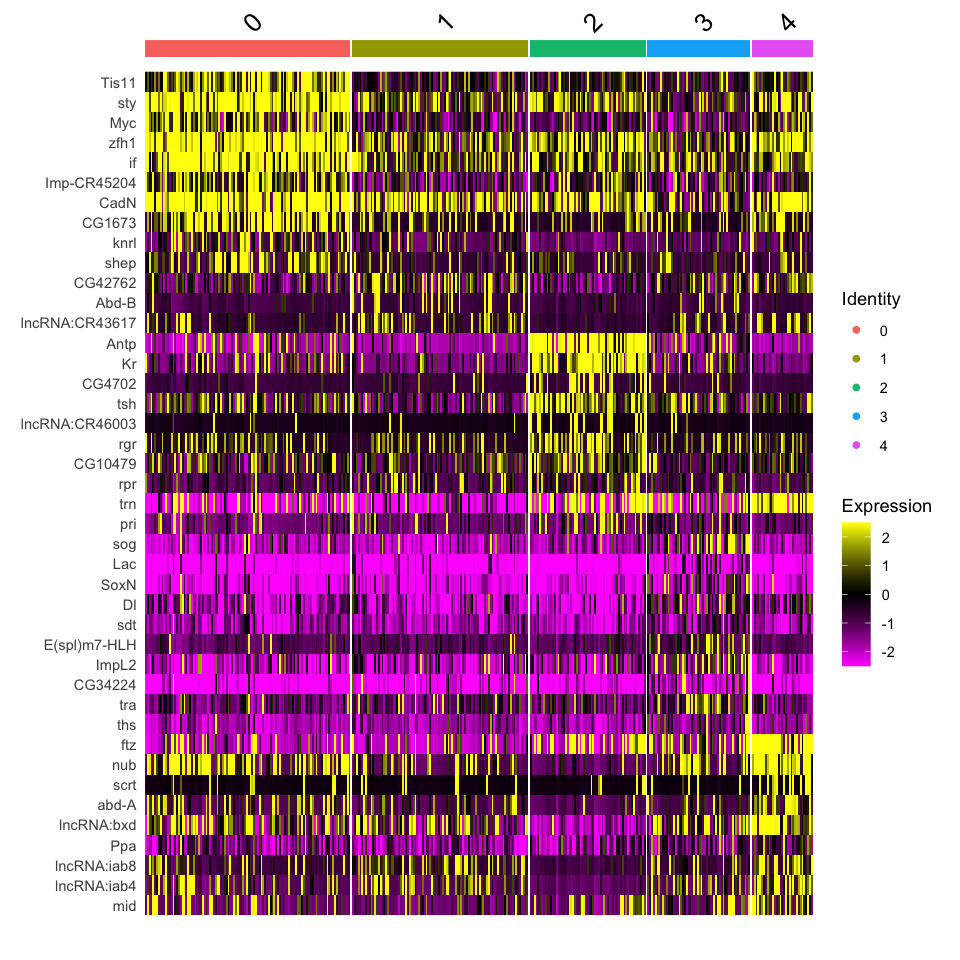

In [12]:
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu.trunk.meso, features = c(all.markers.top10$gene))

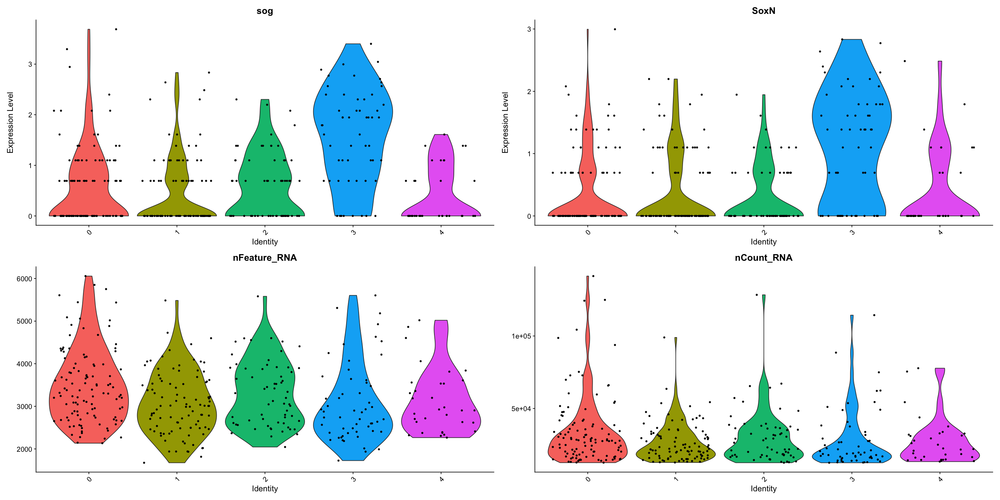

In [13]:
options(repr.plot.width=24, repr.plot.height=12)
VlnPlot(seu.trunk.meso, features = c('sog','SoxN','nFeature_RNA','nCount_RNA'), ncol = 2)

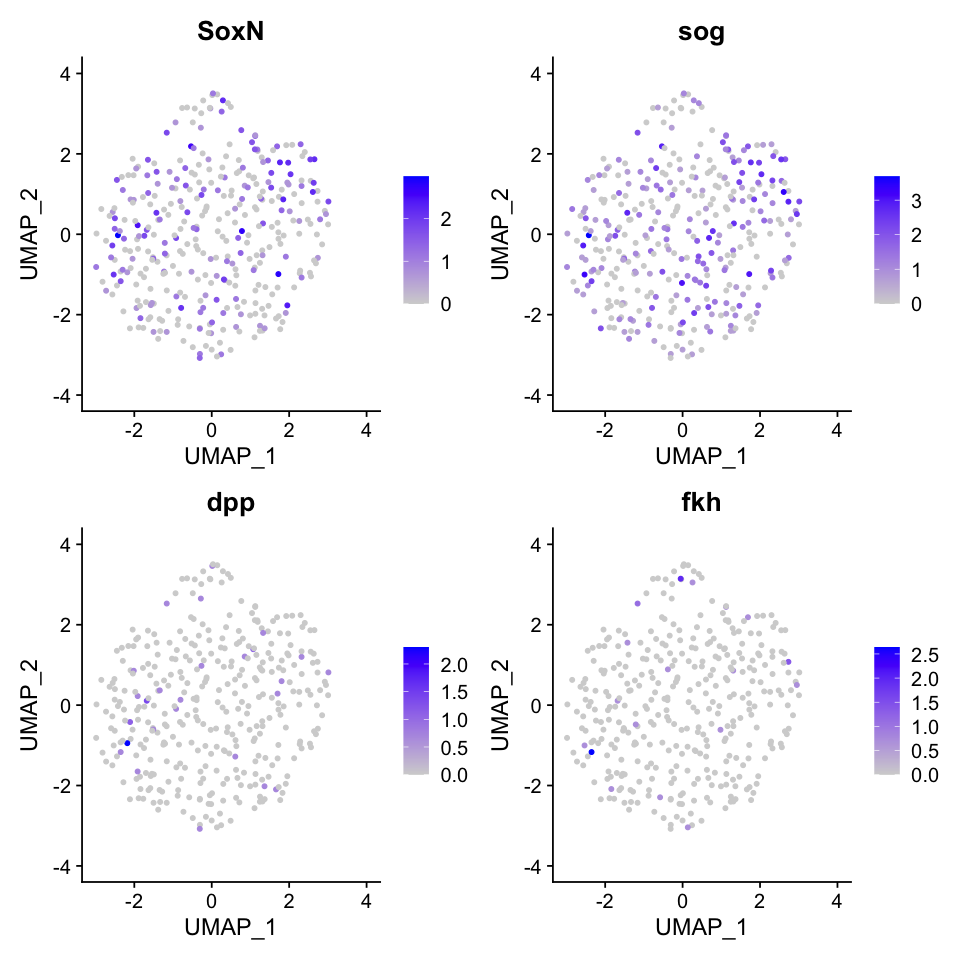

In [14]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = 'umap', features = c('SoxN','sog','dpp','fkh'))

Cluster 3 shows higher expression of ectoderm marker genes. (doublets)

### Removing doublet

In [15]:
doublet.cells <- WhichCells(seu.trunk.meso, ident = 3)
doublet.cells
length(doublet.cells)
seu.doublet <- subset(seu.trunk.meso, ident = 3)
seu.doublet
seu.doublet$manual_ID <- 'doublet'

[1] "GSM2494786_GAATTTGCCACC" "GSM2494786_GAATCATGCAGG"
 [3] "GSM2494786_TTGTAATCGATA" "GSM2494786_AACCTGGTGCAT"
 [5] "GSM2494786_TCAACCGAGCCT" "GSM2494786_AACATCCCCACG"
 [7] "GSM2494786_AAAGAATTGATA" "GSM2494786_GCCCTAACTCTA"
 [9] "GSM2494786_GAACGTCCAGAG" "GSM2494786_GAACCAAGTTGC"
[11] "GSM2494786_GCGCGCGTGGGA" "GSM2494786_GGGACGTTAAGA"
[13] "GSM2494786_ATTTCAGCGCTT" "GSM2494786_GTTTTAGTCGGT"
[15] "GSM2494786_TTTGGGATCAGC" "GSM2494786_AGTTGTGAGGAA"
[17] "GSM2494786_AGAGACCCTGAC" "GSM2494786_GATGAACAGCAG"
[19] "GSM2494788_TTGGCCCAGACT" "GSM2494789_ATCACCCGGCAC"
[21] "GSM2494789_ACAAATGTCGCG" "GSM2494789_ATCCCTAGTTTT"
[23] "GSM2494789_TGATCGACGGAT" "GSM2494789_TTTGAGCTATTT"
[25] "GSM2494789_AAAACCGCGTGA" "GSM2494789_ACTAACAGAGTG"
[27] "GSM2494789_ACAGTTCCCCAA" "GSM2494789_CGGAAAACGTGN"
[29] "GSM2494789_ATTTGGTCTAGC" "GSM2494789_TTTGGCGACCGA"
[31] "GSM2494789_CTACGCGCAGGT" "GSM2494789_AGGACGTCCTGC"
[33] "GSM2494787_ATAAGTGGACTA" "GSM2494787_GCATGATTAGCG"
[35] "GSM2494787_GCCAACCGAGAA" "GSM2494787_CTGAAACCCAGC"
[37] "GSM2494787_GAGCGGCCCTGA" "GSM2494787_CGCCCTATCCAG"
[39] "GSM2494785_GCTATGAGCTTG" "GSM2494785_AACTCGATGTTA"
[41] "GSM2494785_CAGCTCATCTAA" "GSM2494785_GATATATTTAGC"
[43] "GSM2494785_TGGTCAGAACCA" "GSM2494785_TTTTTGGTAACT"
[45] "GSM2494785_GGTCCTAGATGC" "GSM2494783_ACCATAACGATA"
[47] "GSM2494783_GACTGGAACTTC" "GSM2494783_ACGCCCGACGAN"
[49] "GSM2494783_CATGCGGCGTTC" "GSM2494783_CTATCCGGCCAA"
[51] "GSM2494784_AGGCCCTACTAT" "GSM2494784_GACACCCGACGT"
[53] "GSM2494784_GATTCTTGTCGC" "GSM2494784_CAGCCTGGCACG"
[55] "GSM2494784_CCTCTCATCACT" "GSM2494784_CCGTATCGGTTT"

[1] 56

An object of class Seurat 
24184 features across 56 samples within 2 assays 
Active assay: SCT (10063 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [16]:
seu.trunk.meso <- subset(seu.trunk.meso, ident = c(3), invert = T)
seu.trunk.meso

An object of class Seurat 
24184 features across 304 samples within 2 assays 
Active assay: SCT (10063 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### Clustering without doublet

PC_ 1 
Positive:  CG13427, Lac, CG34224, CG15628, SoxN, Tom, CG5059, Atx-1, sdt, ths 
	   Dl, Ptr, sog, Brd, kek1, E(spl)m4-BFM, ASPP, ImpL2, grh, aop 
	   CG10035, cv-2, 5-HT2A, rho, Pino, bib, D, Ppa, blot, Doc1 
Negative:  Ilp4, hll, twi, VepD, sna, Cyp310a1, CG3036, CG12177, CadN, CG14688 
	   Act87E, Mes2, CG16758, tin, zfh1, stumps, Mef2, htl, Nplp2, stg 
	   sty, lncRNA:CR45361, if, Pka-C3, sprt, CG9005, Asph, Ama, ltl, tkv 
PC_ 2 
Positive:  wech, hth, Myc, Imp-CR45204, mt:CoI, CadN, zfh1, if, trn, lncRNA:roX1 
	   spen, sty, CG9005, fax, fs(1)h, mnb, Pka-C3, CycE, ed, Tis11 
	   l(3)neo38, Sxl, pigs, Trf2, Glut4EF, chrb, CG3036, nub, mt:ATPase6, stg 
Negative:  RpS29, RpS20, RpLP1, RpL21, RpL27A, RpL10, RpL15, RpS3A, RpS26, RpS15 
	   RpS16, lncRNA:CR43887, RpLP2, CG43355-sala, RpS8, Tctp, RpS25, RpLP0, RpL41, RpS18 
	   RpL27, CG12177, RpL37A, RpS2, RpL10Ab, wntD, Nplp2, Ilp4, CG14687, CG14111 
PC_ 3 
Positive:  nub, lncRNA:bxd, lncRNA:iab4, lncRNA:iab8, Desat1, abd-A, lncRNA

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 304
Number of edges: 16586

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.3790
Number of communities: 3
Elapsed time: 0 seconds


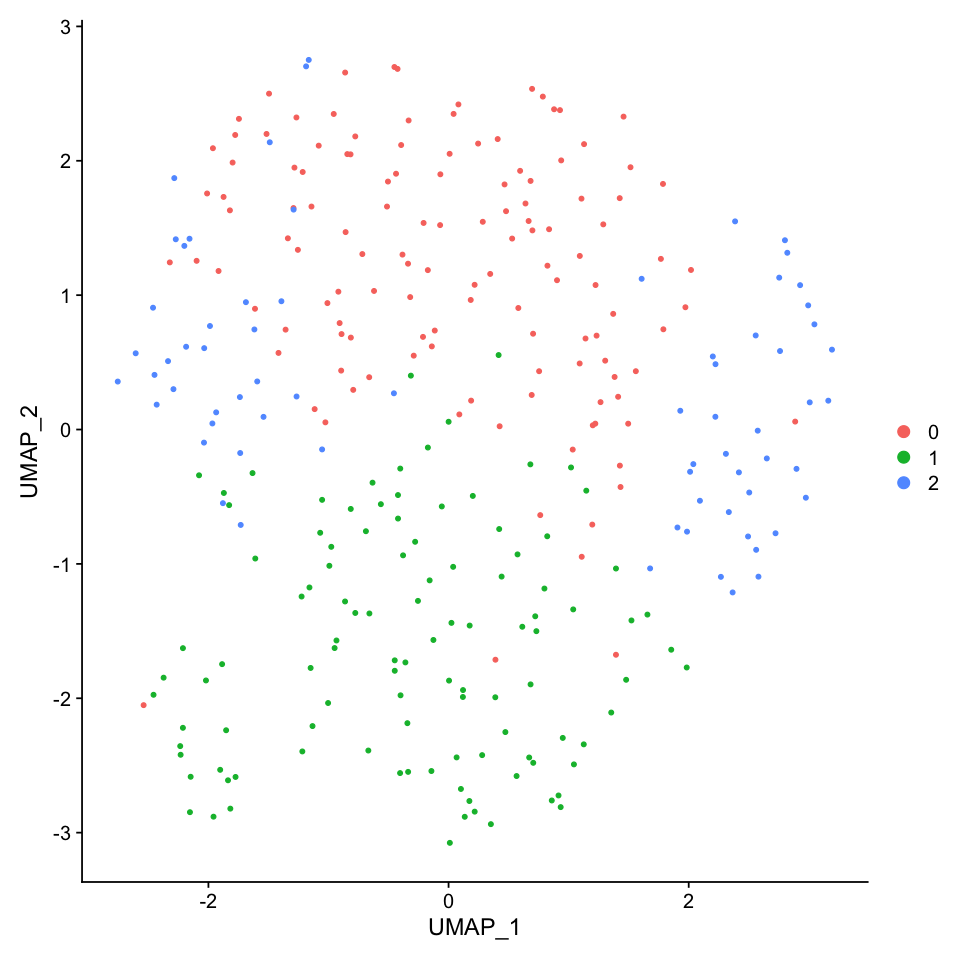

In [17]:
options(repr.plot.width=8, repr.plot.height=8)
seu.trunk.meso <- RunPCA(seu.trunk.meso)
seu.trunk.meso <- RunUMAP(seu.trunk.meso, dims = 1:30)
seu.trunk.meso <- FindNeighbors(seu.trunk.meso, dims = 1:30)
seu.trunk.meso <- FindClusters(seu.trunk.meso)
DimPlot(seu.trunk.meso, reduction = 'umap')

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 304
Number of edges: 16586

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.3112
Number of communities: 4
Elapsed time: 0 seconds


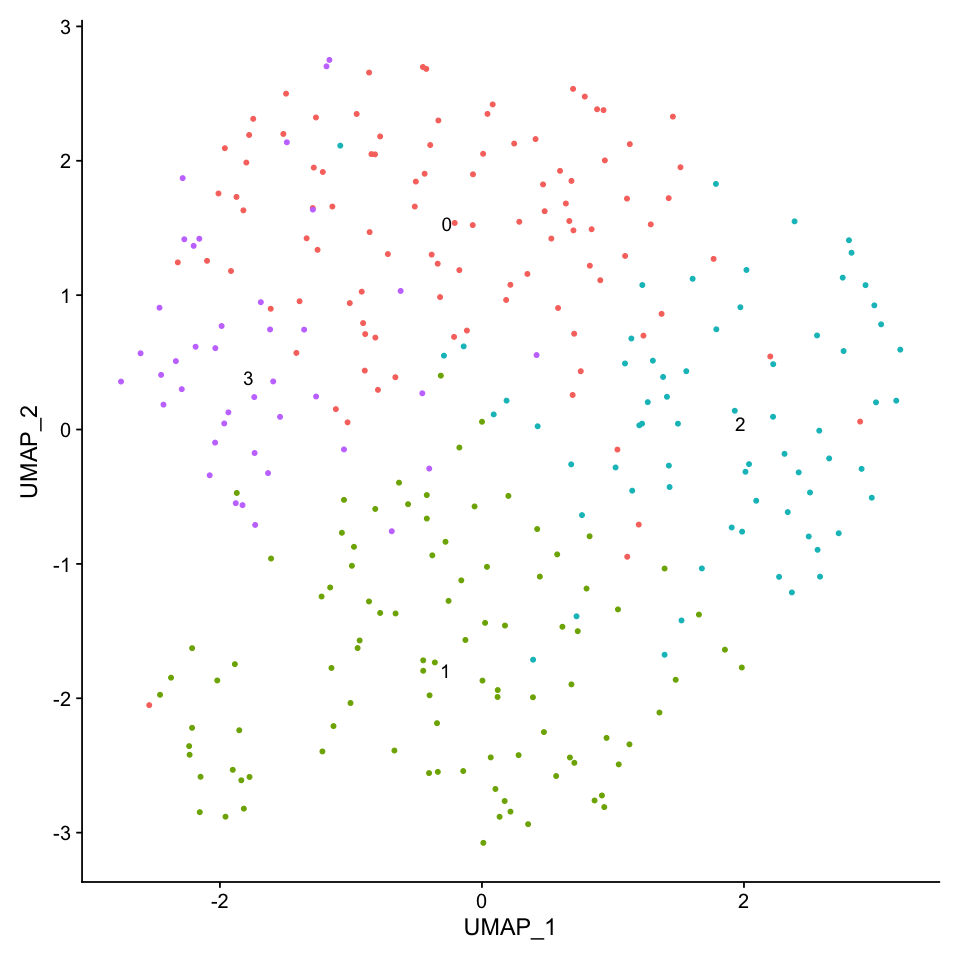

In [18]:
options(repr.plot.width=8, repr.plot.height=8)
seu.trunk.meso <- FindClusters(seu.trunk.meso, resolution = 1.0)
DimPlot(seu.trunk.meso, reduction = 'umap', label = TRUE) + NoLegend()

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 304
Number of edges: 16586

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.2219
Number of communities: 9
Elapsed time: 0 seconds


1 singletons identified. 8 final clusters.



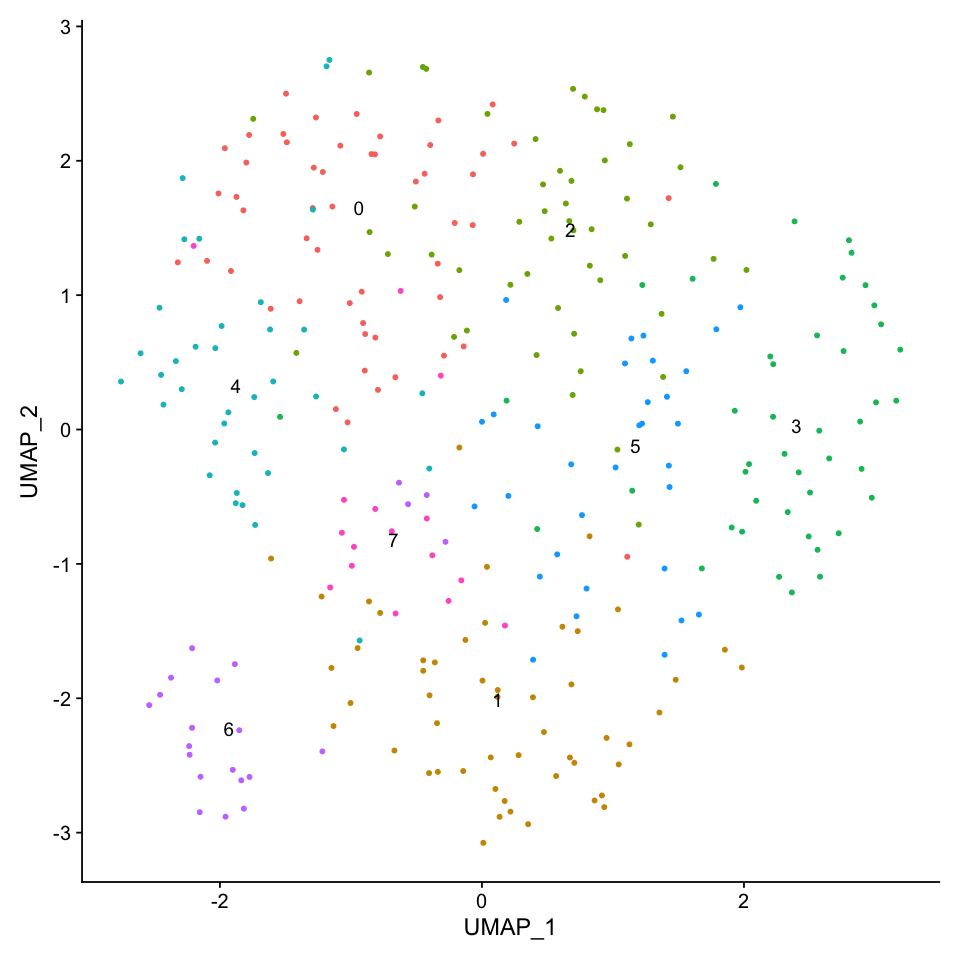

In [19]:
options(repr.plot.width=8, repr.plot.height=8)
seu.trunk.meso <- FindClusters(seu.trunk.meso, resolution = 1.4)
DimPlot(seu.trunk.meso, reduction = 'umap', label = TRUE) + NoLegend()

In [20]:
all.markers <- FindAllMarkers(object = seu.trunk.meso, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7



[1] 646

[1] 76

Warning message in DoHeatmap(seu.trunk.meso, features = c(all.markers.top10$gene)):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: Blos1, Mo25”


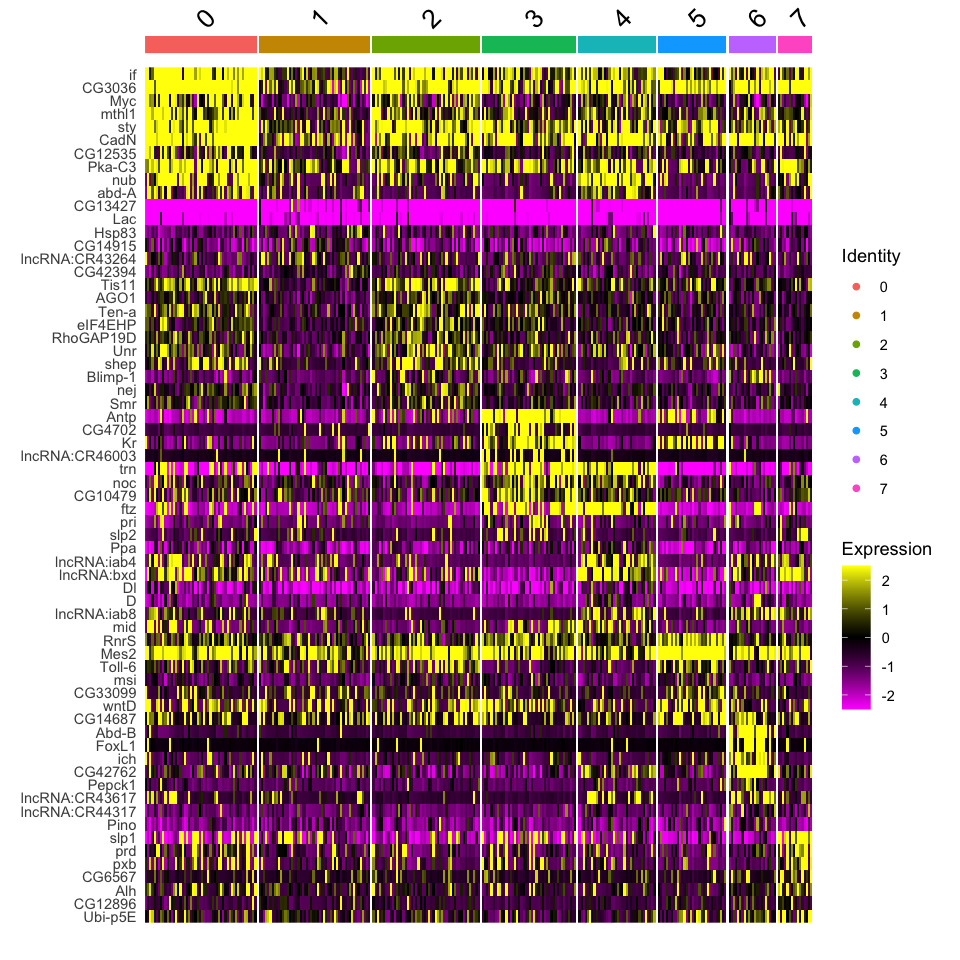

In [21]:
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu.trunk.meso, features = c(all.markers.top10$gene))

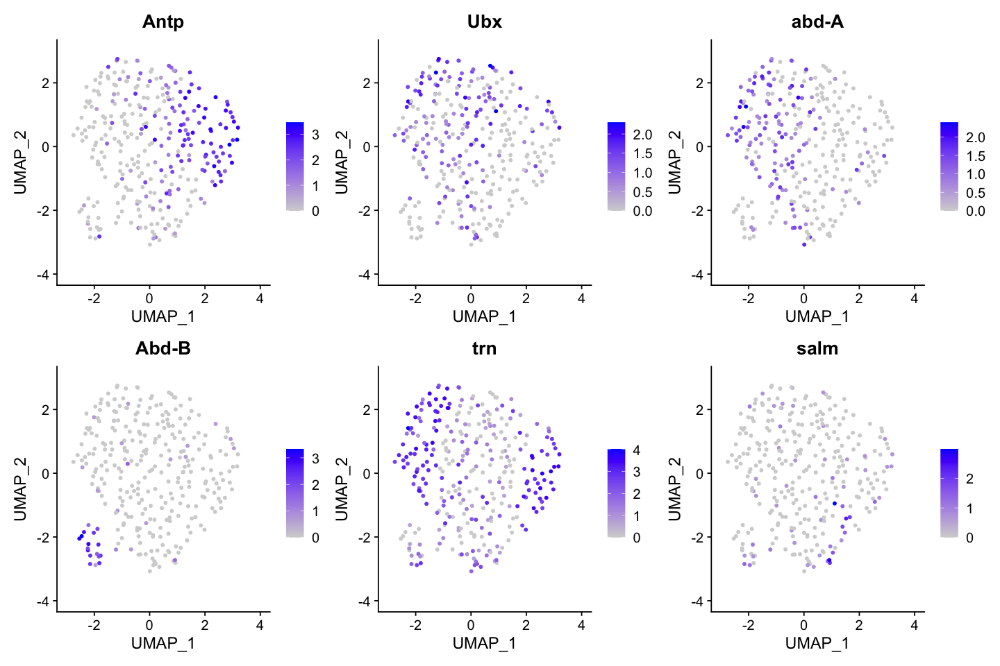

In [22]:
options(repr.plot.width=12, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, 
            reduction = 'umap', 
            features = c('Antp','Ubx','abd-A',
                        'Abd-B','trn', 'salm'),
           ncol = 3)

Cluster 1 does not show any AP-maker genes.

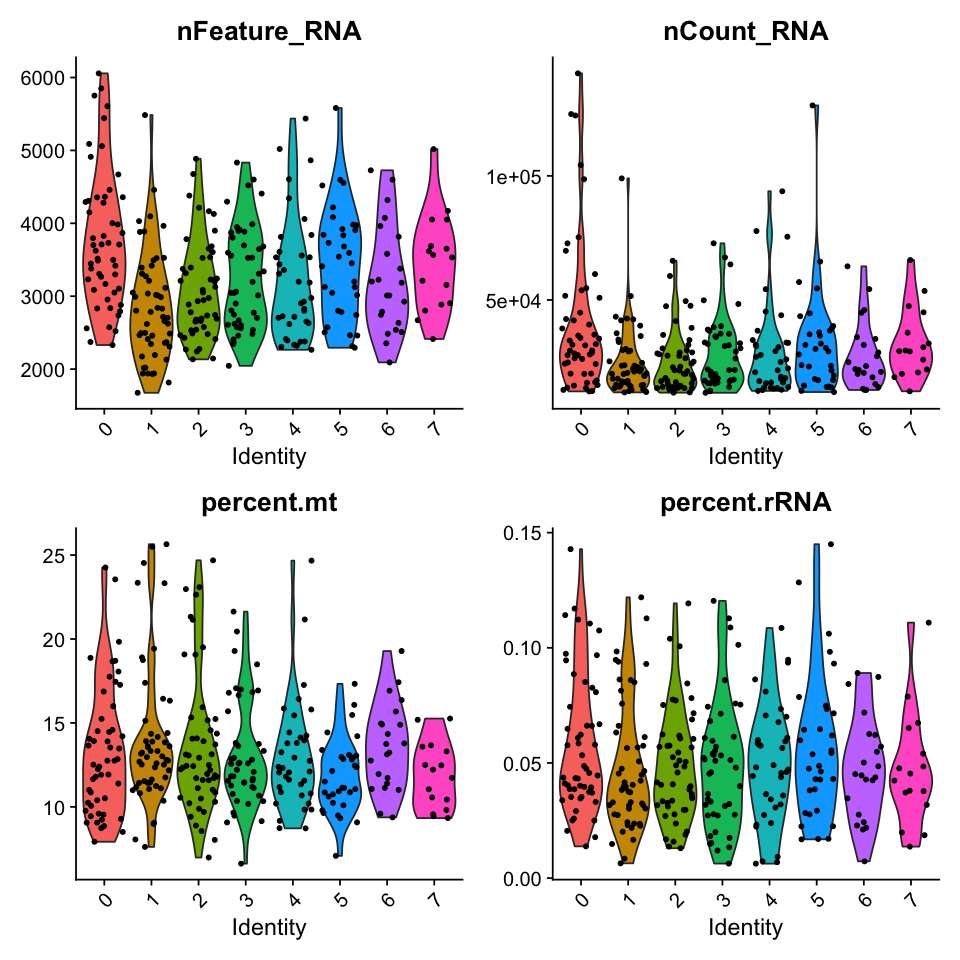

In [23]:
options(repr.plot.width=8, repr.plot.height=8)
VlnPlot(seu.trunk.meso, features = c('nFeature_RNA','nCount_RNA', 'percent.mt','percent.rRNA'), ncol = 2)

Cluster 1 has slightly fewer genes detected.  (low-quality)

### Removing low-quality cells

In [24]:
seu.low.quality <- subset(seu.trunk.meso, idents = 1)
seu.low.quality$manual_ID <- 'low_quality_cells'
seu.low.quality
seu.trunk.meso <- subset(seu.trunk.meso, idents = 1, invert = T)
seu.trunk.meso

An object of class Seurat 
24184 features across 52 samples within 2 assays 
Active assay: SCT (10063 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
24184 features across 252 samples within 2 assays 
Active assay: SCT (10063 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### Clustering without low-quality cells

PC_ 1 
Positive:  CG13427, Lac, CG34224, CG15628, SoxN, Tom, CG5059, Atx-1, sdt, ths 
	   Ptr, sog, Dl, Brd, E(spl)m4-BFM, kek1, ASPP, ImpL2, grh, aop 
	   CG10035, cv-2, 5-HT2A, Pino, bib, rho, D, blot, salm, CG14915 
Negative:  Ilp4, hll, twi, sna, VepD, CG3036, Cyp310a1, CadN, Act87E, CG12177 
	   Mes2, CG14688, CG16758, zfh1, tin, stumps, Mef2, htl, stg, Nplp2 
	   sty, if, lncRNA:CR45361, sprt, CG9005, Pka-C3, Asph, CG1673, Ama, ltl 
PC_ 2 
Positive:  Myc, wech, hth, if, Imp-CR45204, spen, Pka-C3, sty, lncRNA:roX1, nub 
	   CadN, zfh1, mnb, fs(1)h, CG9005, ed, pigs, Tis11, l(3)neo38, NetA 
	   Sxl, chrb, Glut4EF, scyl, mthl1, bun, trn, Trf2, CycE, abd-A 
Negative:  Nplp2, RpLP0, RpS20, RpS3A, Mes2, Tctp, lncRNA:CR43887, RpL15, RpLP1, RpL10 
	   CG43355-sala, RpL21, RpS29, RpS2, Act87E, HmgZ, Abd-B, CG14687, CG12177, CG14688 
	   CG14111, RpL27A, wntD, RpS15, RpS8, RpL10Ab, Cyp1, Sep5, RpLP2, sta 
PC_ 3 
Positive:  lncRNA:bxd, nub, lncRNA:iab4, Desat1, CG42762, lncRNA:iab8, lncRNA:

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 252
Number of edges: 14366

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.3111
Number of communities: 3
Elapsed time: 0 seconds


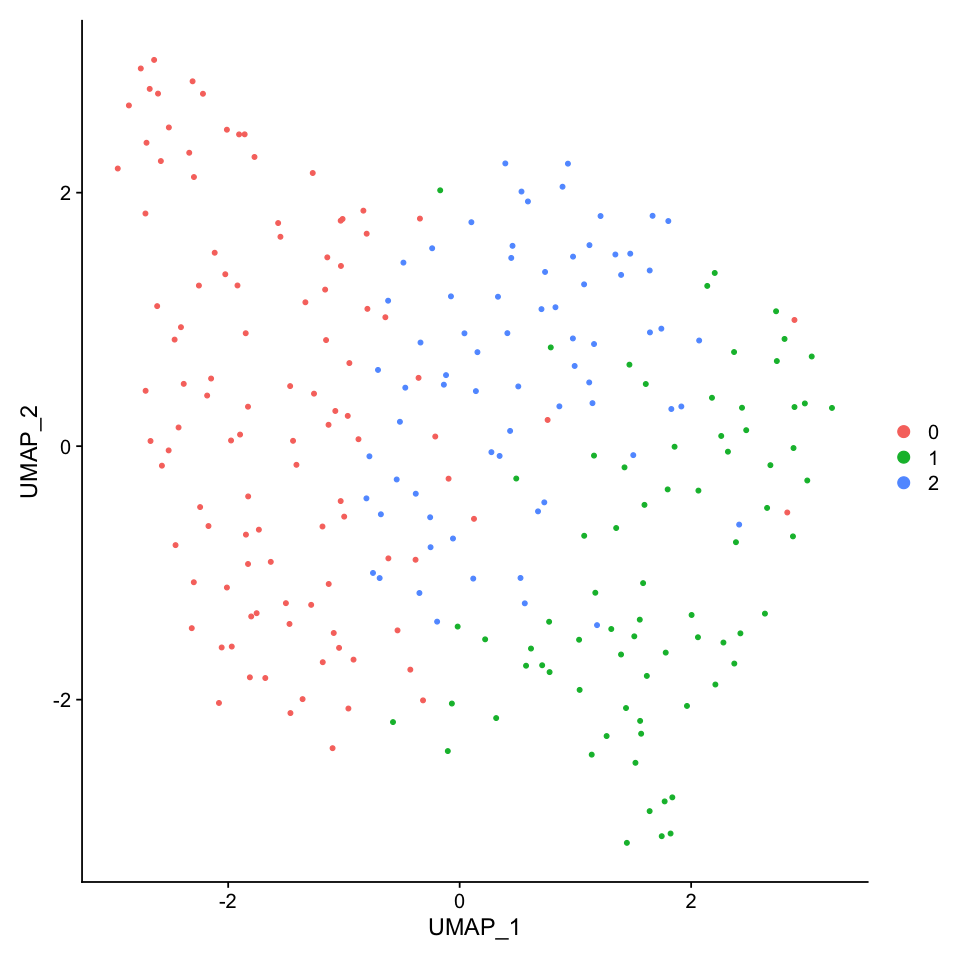

In [25]:
options(repr.plot.width=8, repr.plot.height=8)
seu.trunk.meso <- RunPCA(seu.trunk.meso)
seu.trunk.meso <- RunUMAP(seu.trunk.meso, dims = 1:30)
seu.trunk.meso <- FindNeighbors(seu.trunk.meso, dims = 1:30)
seu.trunk.meso <- FindClusters(seu.trunk.meso)
DimPlot(seu.trunk.meso, reduction = 'umap')

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 252
Number of edges: 14366

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.2539
Number of communities: 4
Elapsed time: 0 seconds


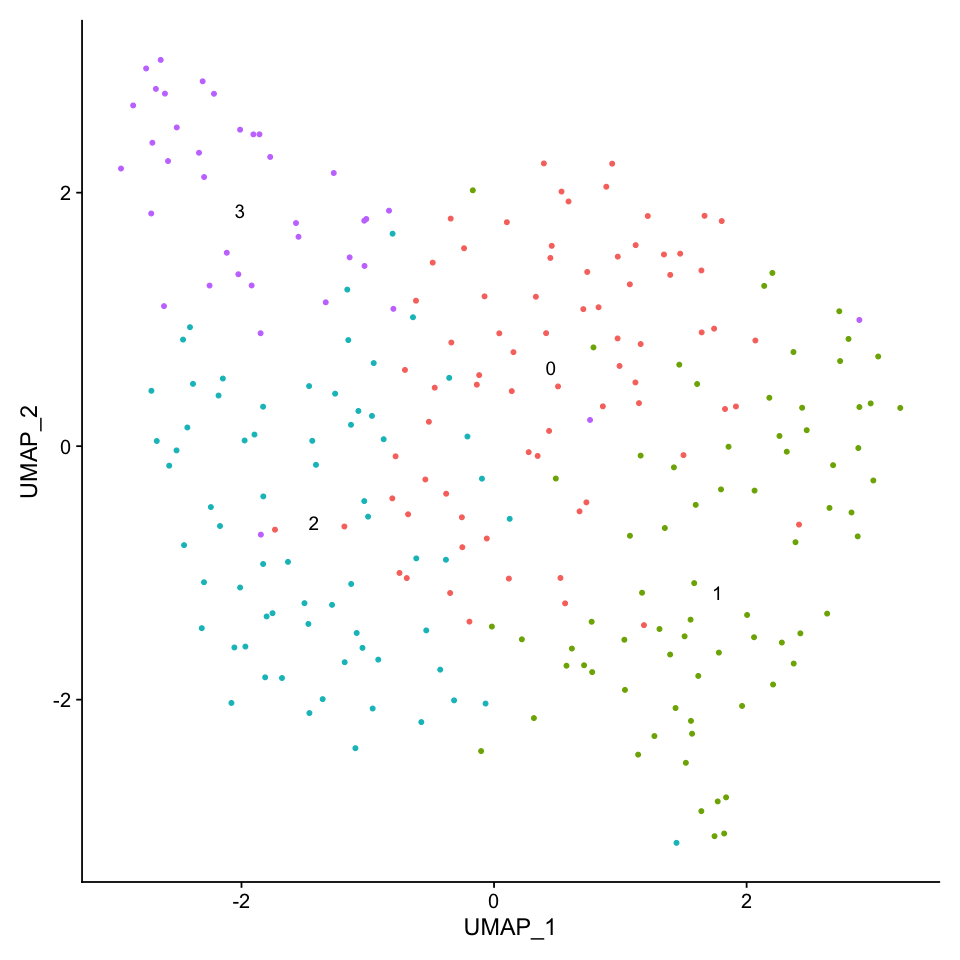

In [26]:
options(repr.plot.width=8, repr.plot.height=8)
seu.trunk.meso <- FindClusters(seu.trunk.meso, resolution = 1.0)
DimPlot(seu.trunk.meso, reduction = 'umap', label = T) + NoLegend()

In [27]:
all.markers <- FindAllMarkers(object = seu.trunk.meso, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3



[1] 257

[1] 40

Warning message in DoHeatmap(seu.trunk.meso, features = c("Ubx", "abd-A", "trn", :
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: CG11885, CG32280”


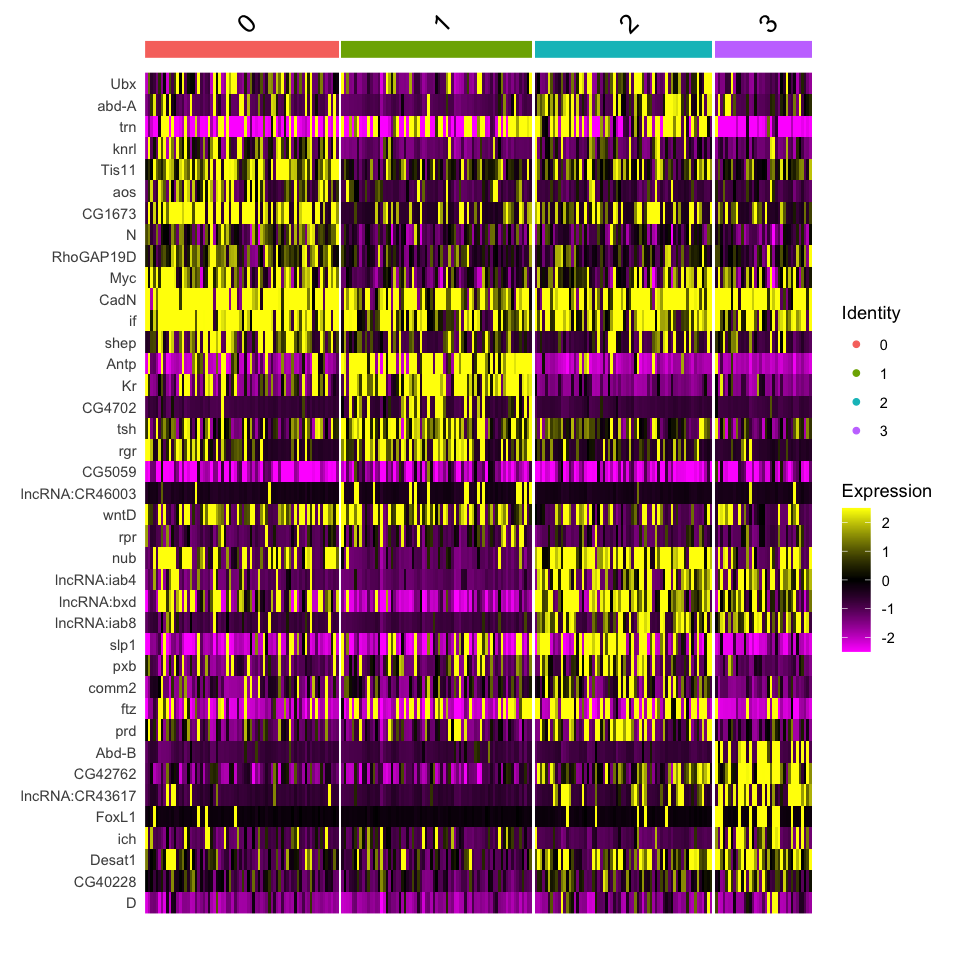

In [28]:
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu.trunk.meso, features = c('Ubx','abd-A','trn',all.markers.top10$gene))

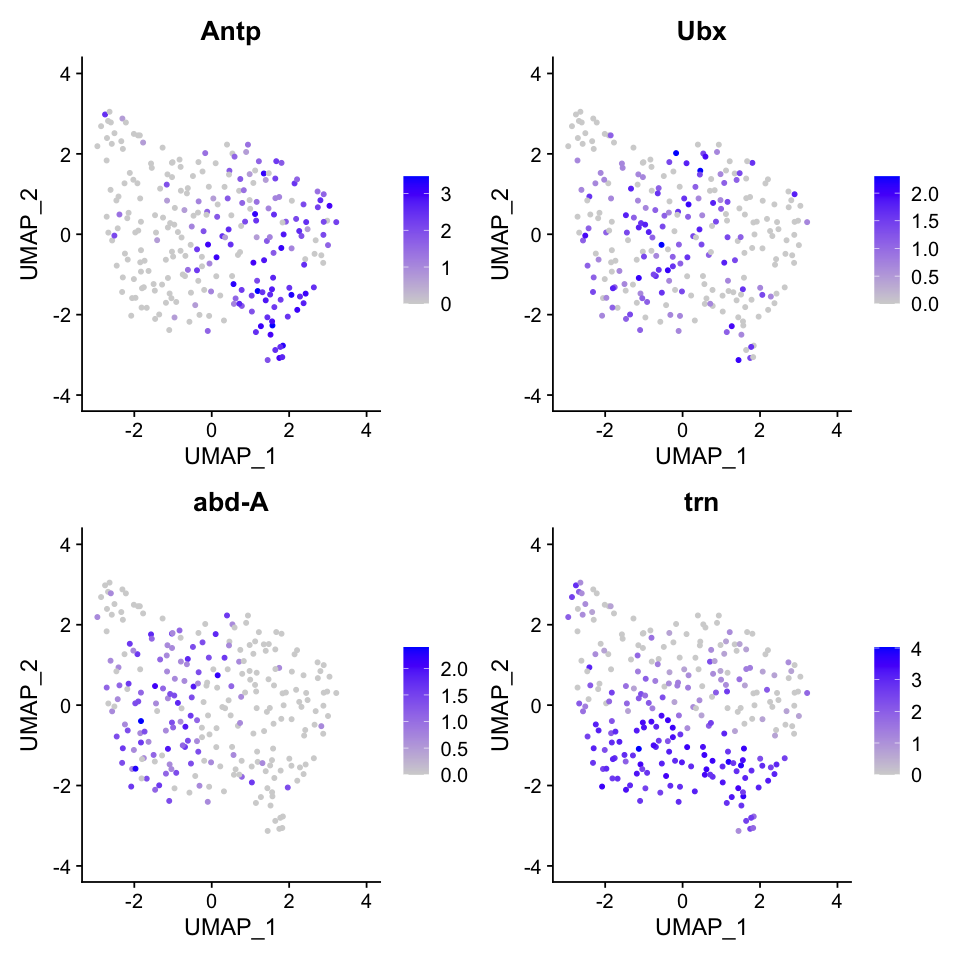

In [29]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = 'umap', features = c('Antp','Ubx','abd-A','trn'))

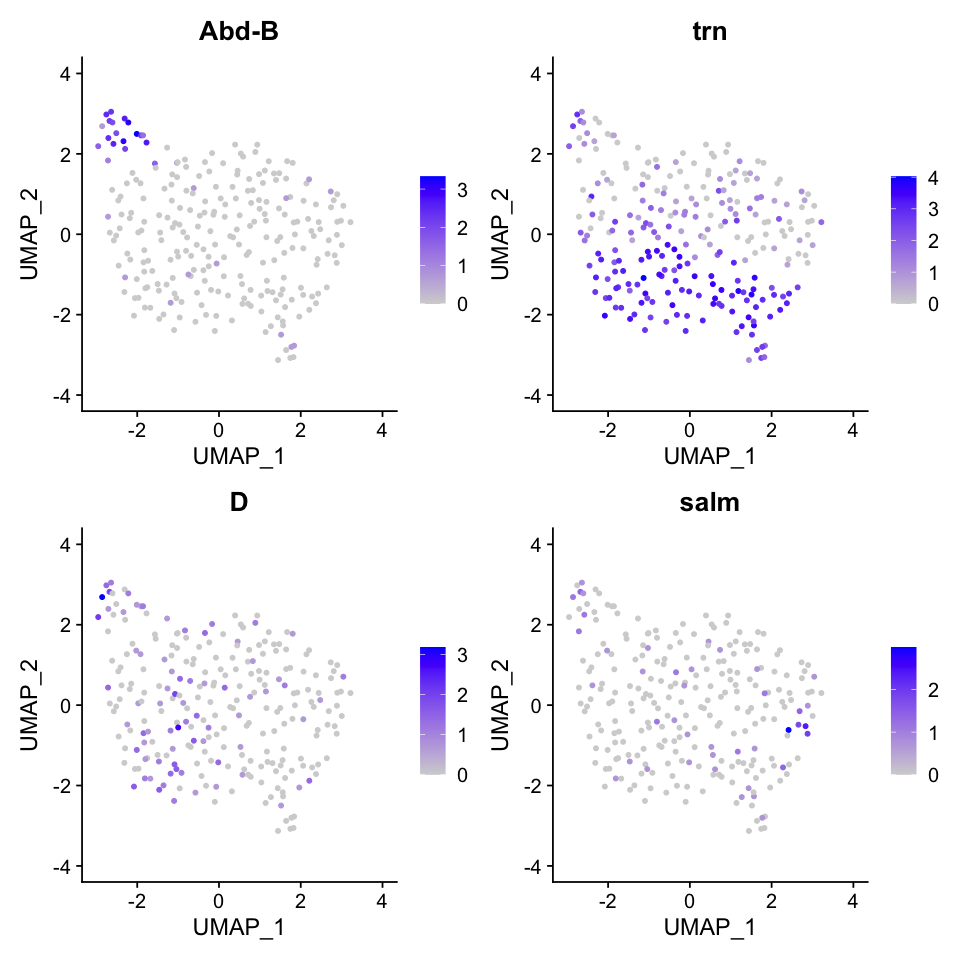

In [30]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = 'umap', features = c('Abd-B','trn','D','salm'))

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 252
Number of edges: 14366

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.2539
Number of communities: 4
Elapsed time: 0 seconds


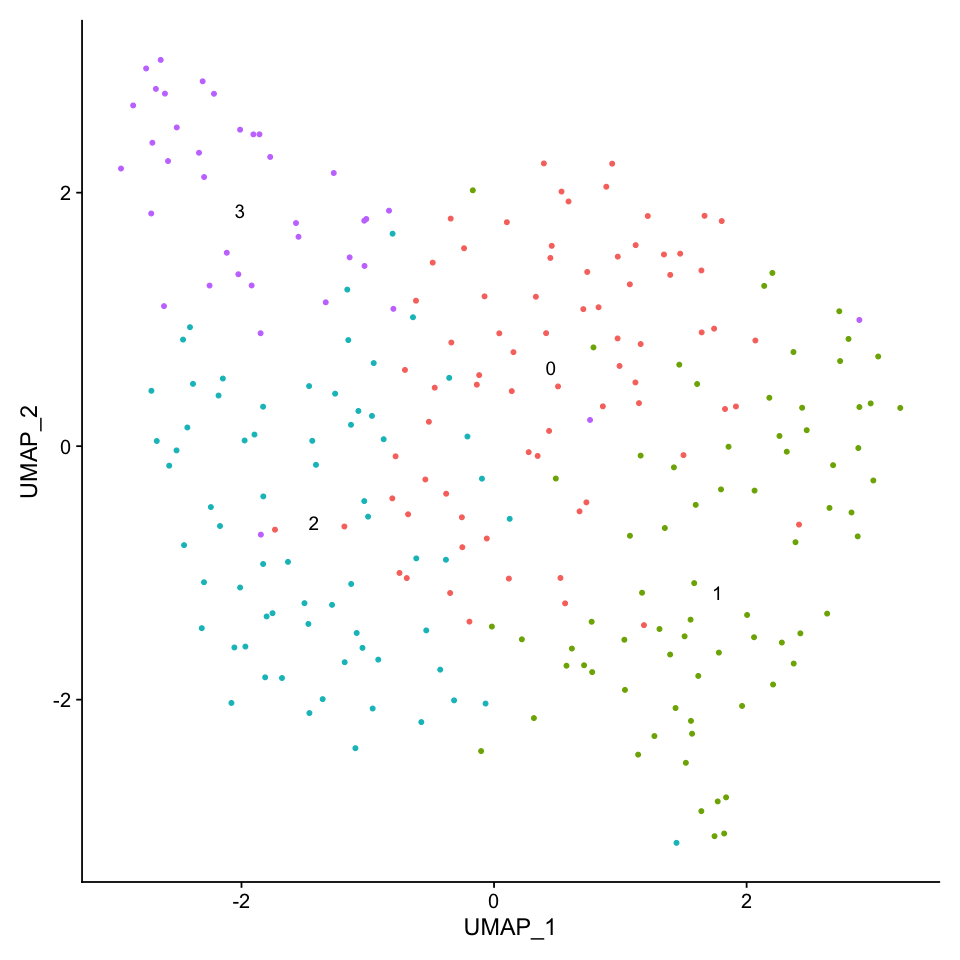

In [31]:
options(repr.plot.width=8, repr.plot.height=8)
seu.trunk.meso <- FindClusters(seu.trunk.meso, resolution = 1.0)
DimPlot(seu.trunk.meso, reduction = 'umap', label = T) + NoLegend()

,manual_ID
,<fct>
GSM2494786_TCATCTTATACA,0
GSM2494786_CGAAGAACAAGA,2
GSM2494786_CTACCTTCGGTC,1
GSM2494786_CTCATCAACTGG,3
GSM2494786_GTTTAGGAATCG,3
GSM2494786_CAGCTCAATACT,1


,manual_ID
,<fct>
GSM2494786_TCATCTTATACA,mesoderm_abdominal
GSM2494786_CGAAGAACAAGA,mesoderm_abdominal
GSM2494786_CTACCTTCGGTC,mesoderm_PS4-6
GSM2494786_CTCATCAACTGG,mesoderm_PS13
GSM2494786_GTTTAGGAATCG,mesoderm_PS13
GSM2494786_CAGCTCAATACT,mesoderm_PS4-6


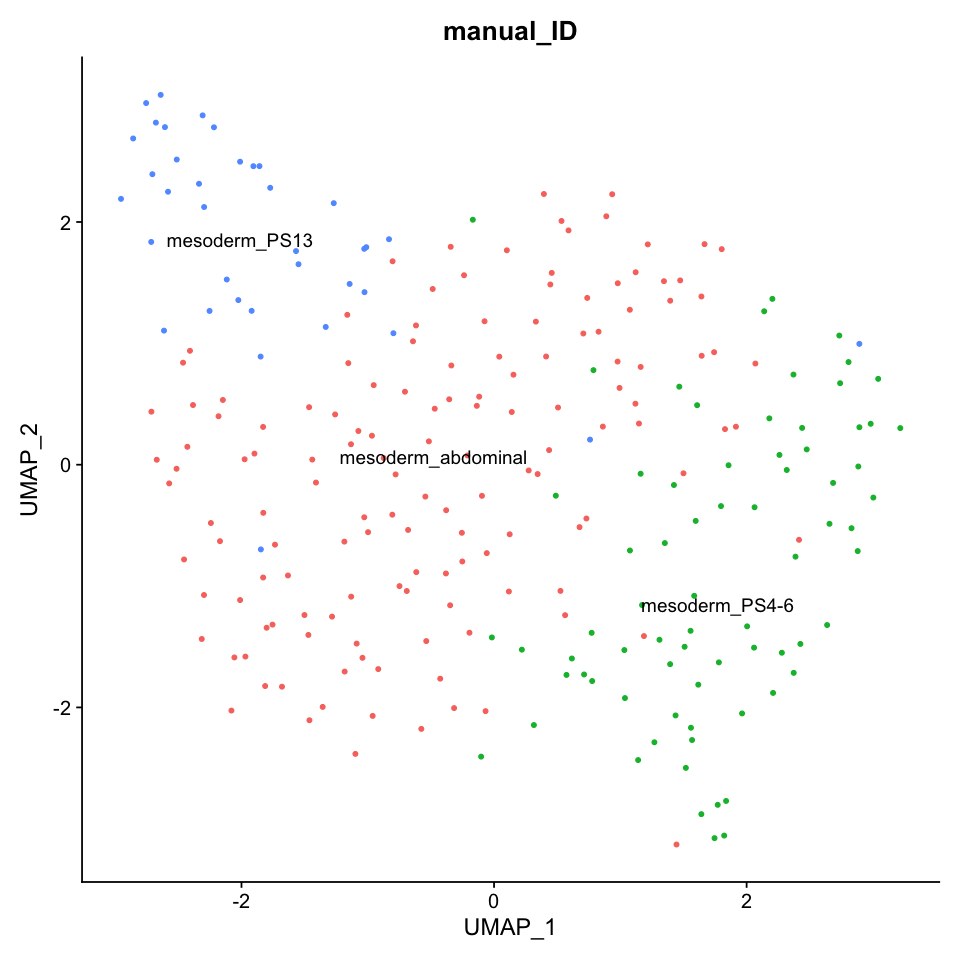

In [32]:
manual_id <- as.data.frame(seu.trunk.meso$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)
manual_id$manual_ID <- dplyr::recode(manual_id$manual_ID, 
                                "0" = "mesoderm_abdominal",
                                "1" = "mesoderm_PS4-6",
                                "2" = "mesoderm_abdominal",
                                "3" = "mesoderm_PS13"
                                )
head(manual_id)
seu.trunk.meso$manual_ID <- manual_id
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.trunk.meso, reduction = 'umap', label = T, group.by = 'manual_ID') + NoLegend() 

In [33]:
Idents(seu.trunk.meso) <- 'manual_ID'
levels(seu.trunk.meso) <- c('mesoderm_PS4-6','mesoderm_abdominal', 'mesoderm_PS13')
all.markers <- FindAllMarkers(object = seu.trunk.meso, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster mesoderm_PS4-6

Calculating cluster mesoderm_abdominal

Calculating cluster mesoderm_PS13



[1] 144

[1] 30

Warning message in DoHeatmap(seu.trunk.meso, features = c("Dfd", "Antp", "Ubx", :
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: CG11885, CG32280”


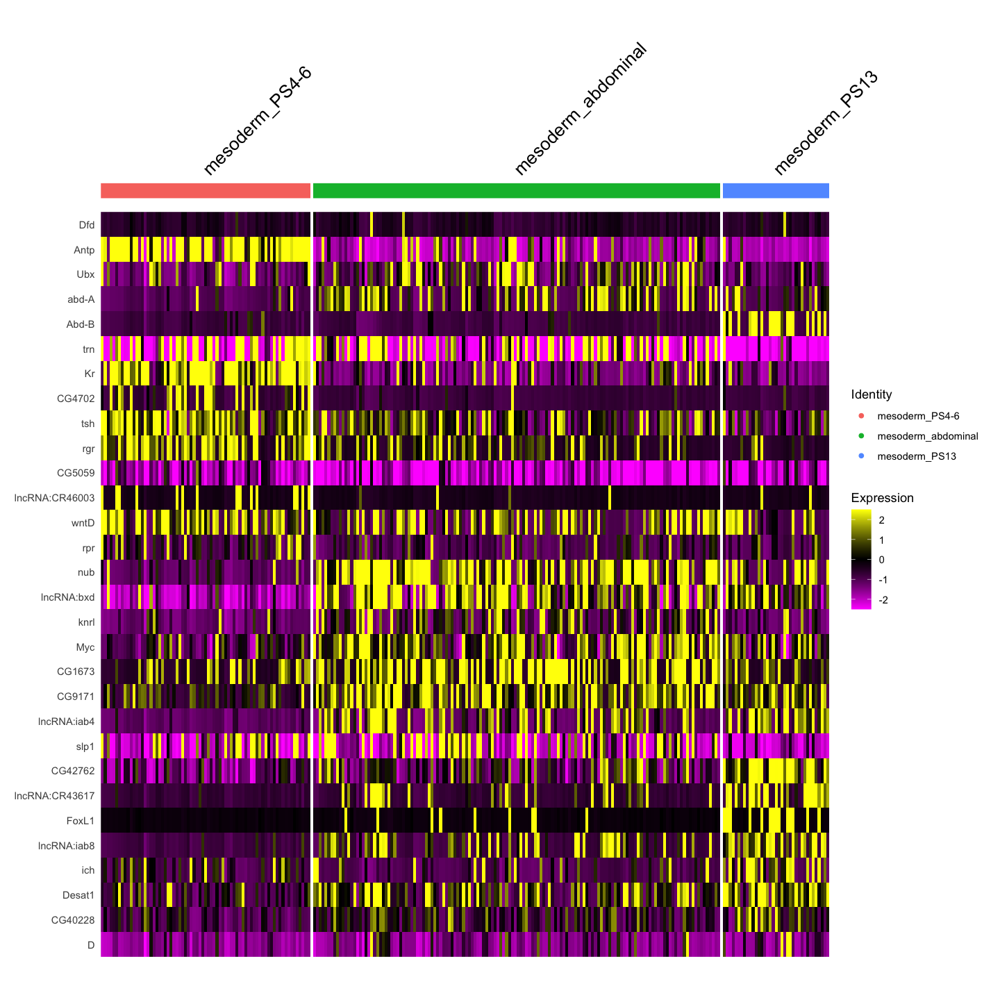

In [34]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.trunk.meso, features = c("Dfd","Antp","Ubx","abd-A","Abd-B","trn", all.markers.top10$gene))

Saving 7 x 7 in image



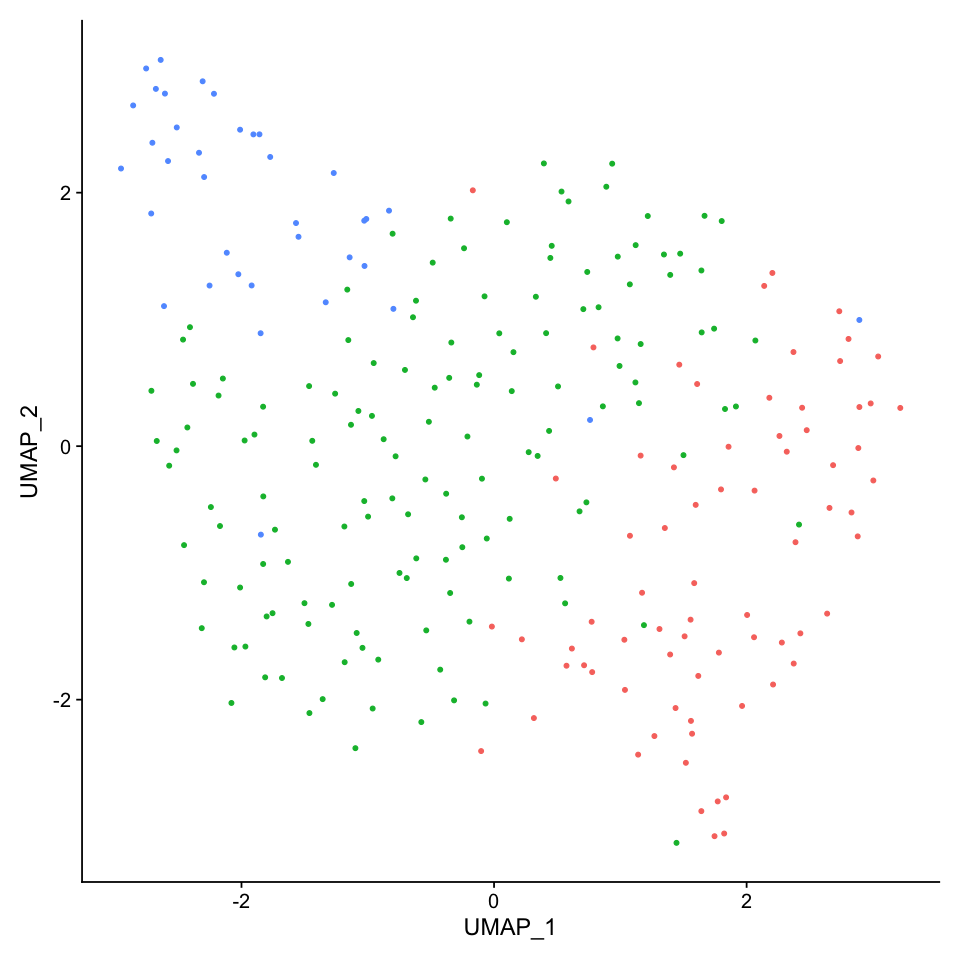

In [35]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.trunk.meso, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/04_mesoderm_subclustering_NK/trunk_meso_umap1.eps", dpi = 300)

Saving 7 x 7 in image



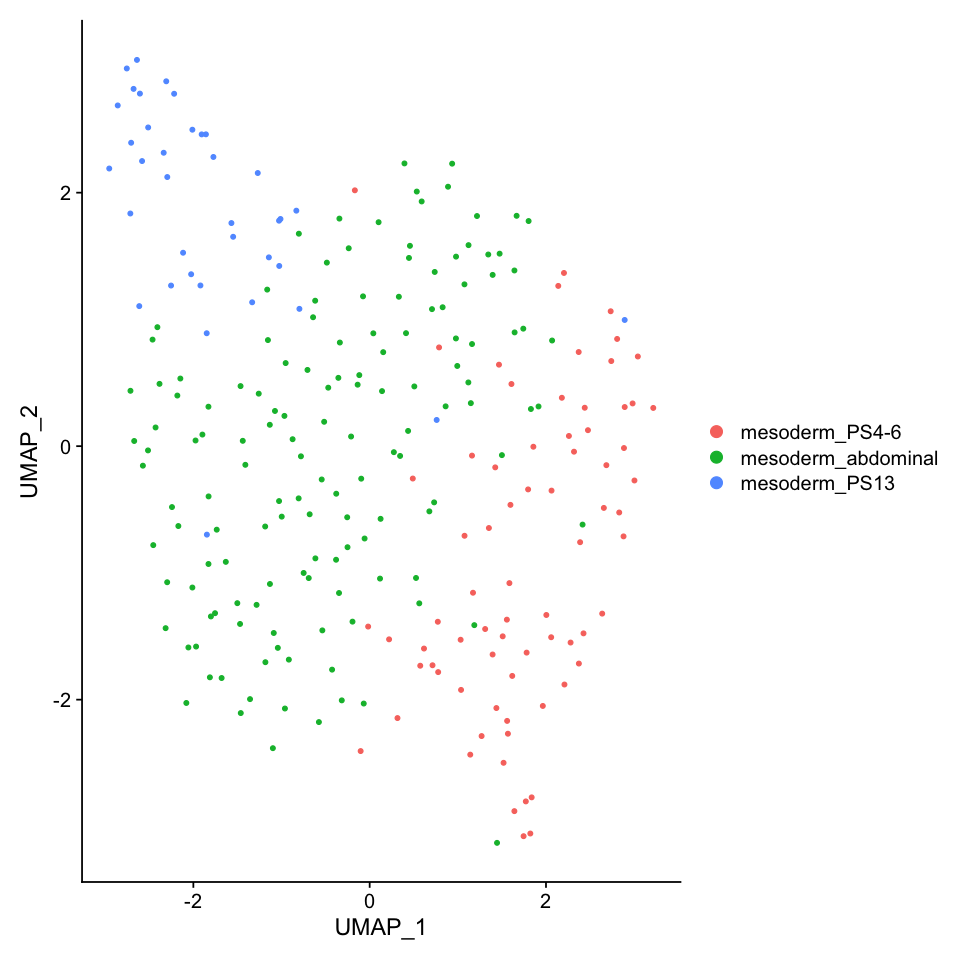

In [36]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.trunk.meso, reduction =  "umap", label = FALSE)

fig
ggsave(fig, file = "./figures/04_mesoderm_subclustering_NK/trunk_meso_umap2.eps", dpi = 300)

Warning message in DoHeatmap(seu.trunk.meso, features = c(all.markers.top10$gene)):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: CG11885, CG32280”


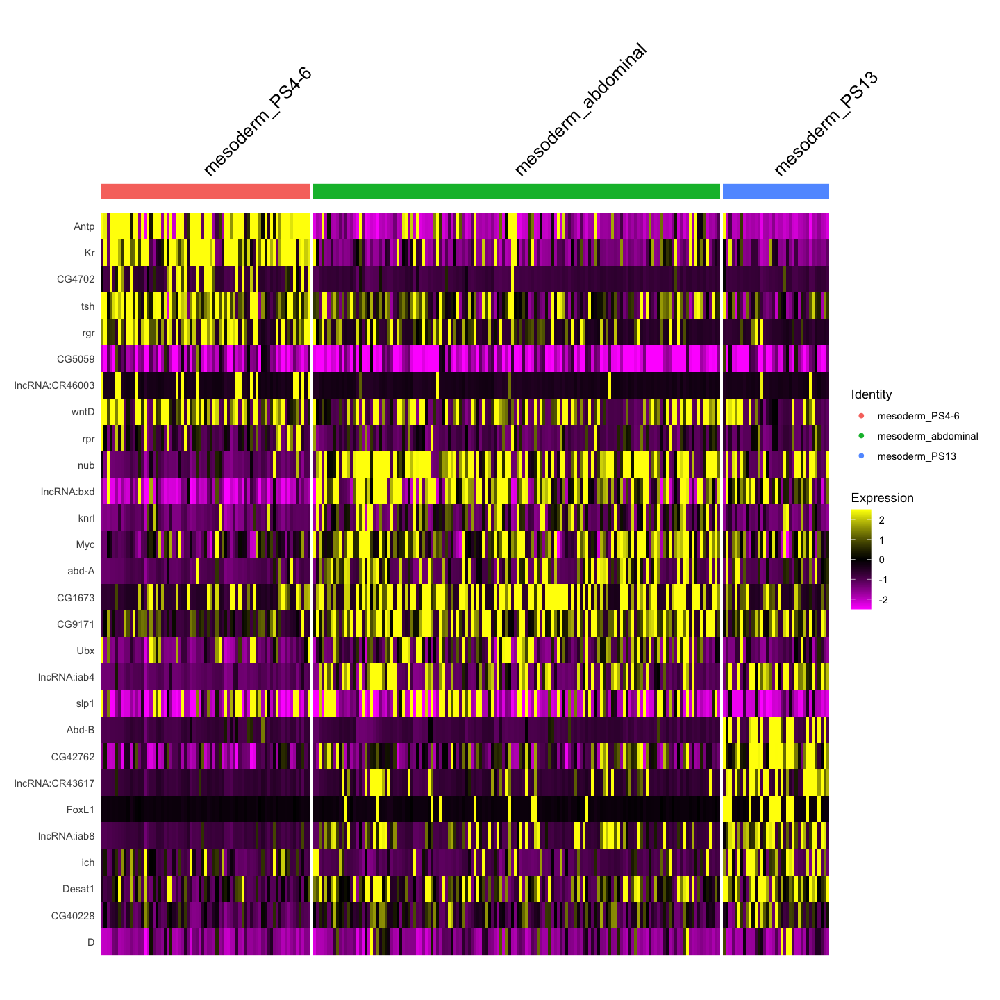

In [37]:
options(repr.plot.width=12, repr.plot.height=12)
fig <- DoHeatmap(seu.trunk.meso, features = c(all.markers.top10$gene))
fig
ggsave(fig, file = "./figures/04_mesoderm_subclustering_NK/trunk_meso_manualID_heatmap.eps", dpi = 300,  width = 12, height = 8)

## Anterior mesoderm (gcm+)
### picking up target clusters

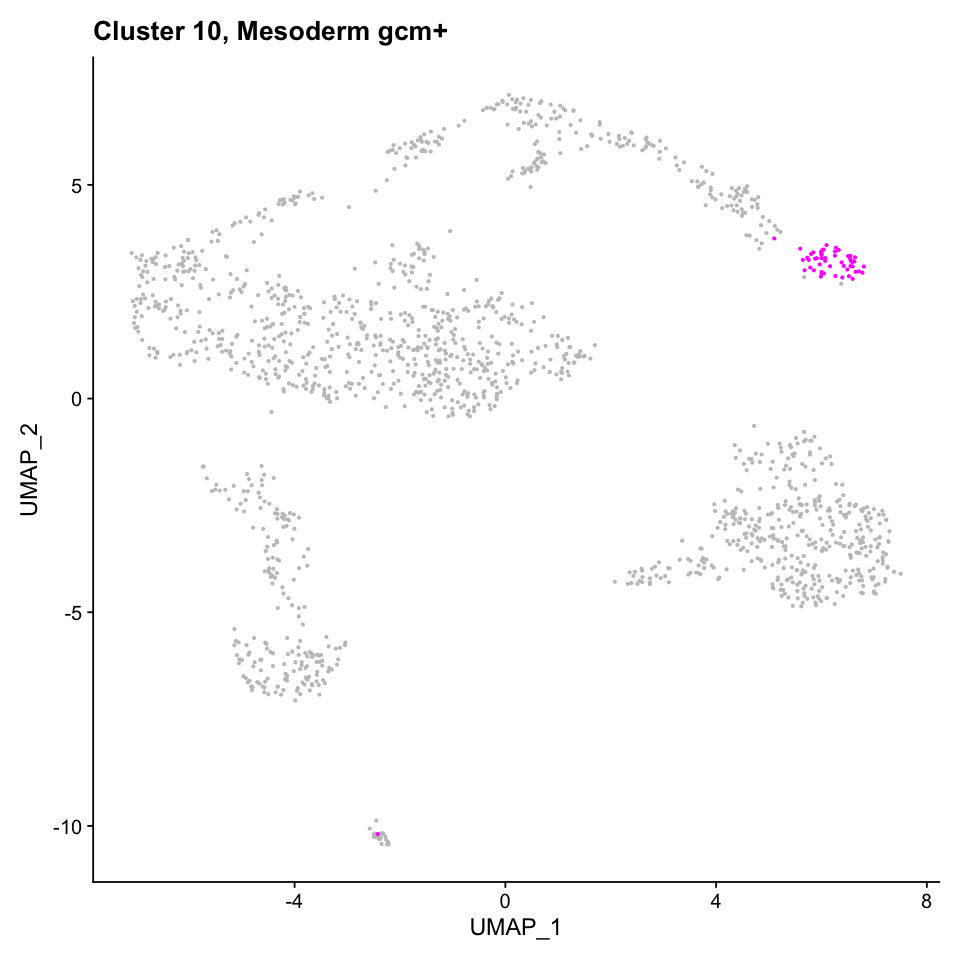

In [38]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(10))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Cluster 10, Mesoderm gcm+')

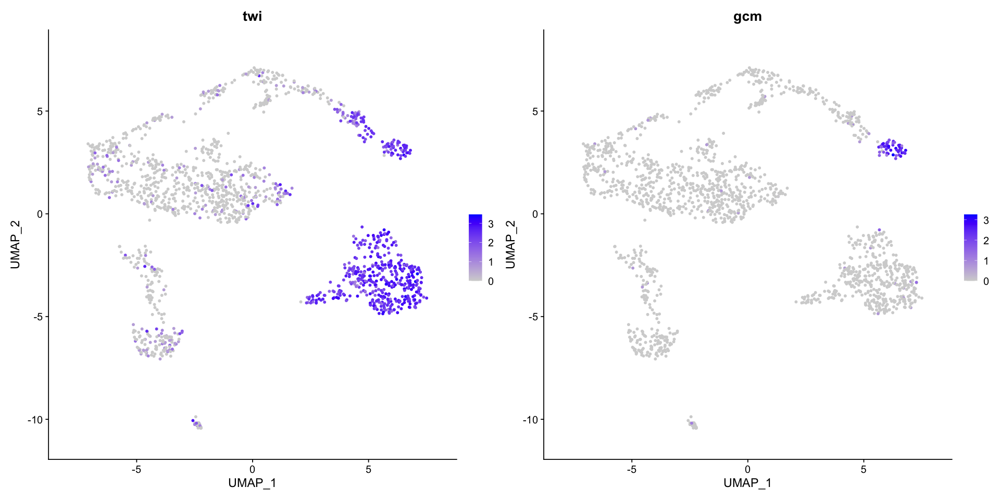

In [39]:
options(repr.plot.width=16, repr.plot.height=8)
FeaturePlot(seu_HQC, reduction = 'umap', features = c('twi', 'gcm'))

In [40]:
seu.meso.gcm <- subset(seu_HQC, ident = c(10))
seu.meso.gcm

An object of class Seurat 
24184 features across 53 samples within 2 assays 
Active assay: SCT (10063 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### Clustering
Num of cells < 500  
Skipping re-normalize

Warning message in irlba(A = t(x = object), nv = npcs, ...):
“You're computing too large a percentage of total singular values, use a standard svd instead.”
PC_ 1 
Positive:  CG13427, Tom, Lac, BobA, CG34224, CG10035, Brd, Atx-1, ths, tsh 
	   ftz, ImpL2, lncRNA:bxd, Ptr, Antp, sca, CG5059, ASPP, aop, Kr 
	   ci, D, run, E(spl)m4-BFM, E2f1, grh, cv-2, kek1, mid, Ubx 
Negative:  ham, gcm, CrebA, knrl, RhoL, zfh1, Ilp4, hll, shep, kni 
	   srp, VepD, CG10570-CG42502, ttk, CG33099, CG12177, Mes2, ltl, twi, CG2865 
	   CadN, Pka-C3, CG14688, NetB, rib, be, pigs, btd, fok, aos 
PC_ 2 
Positive:  vvl, sty, fax, rpr, Tollo, Myc, Imp-CR45204, slp2, CG15628, Ndae1 
	   NetB, spen, hth, kis, smal, Blimp-1, CG9821, Dfd, dpr9, pxb 
	   slp1, btd, mahe, Fur1, pigs, Dmtn, fs(1)h, wech, noc, pre-lola-G-lola 
Negative:  ttk, CG16886, edl, fok, CG11905, CG3036, RpS20, Nplp2, lncRNA:CR43432, RpLP1 
	   CG16758, CG14427, RpS29, RpS2, RpLP2, RpL15, RpS26, RpL37A, DNaseII, RpL10Ab 
	   cv-d, hll, RpS8, RpS

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 53
Number of edges: 1378

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.2000
Number of communities: 1
Elapsed time: 0 seconds


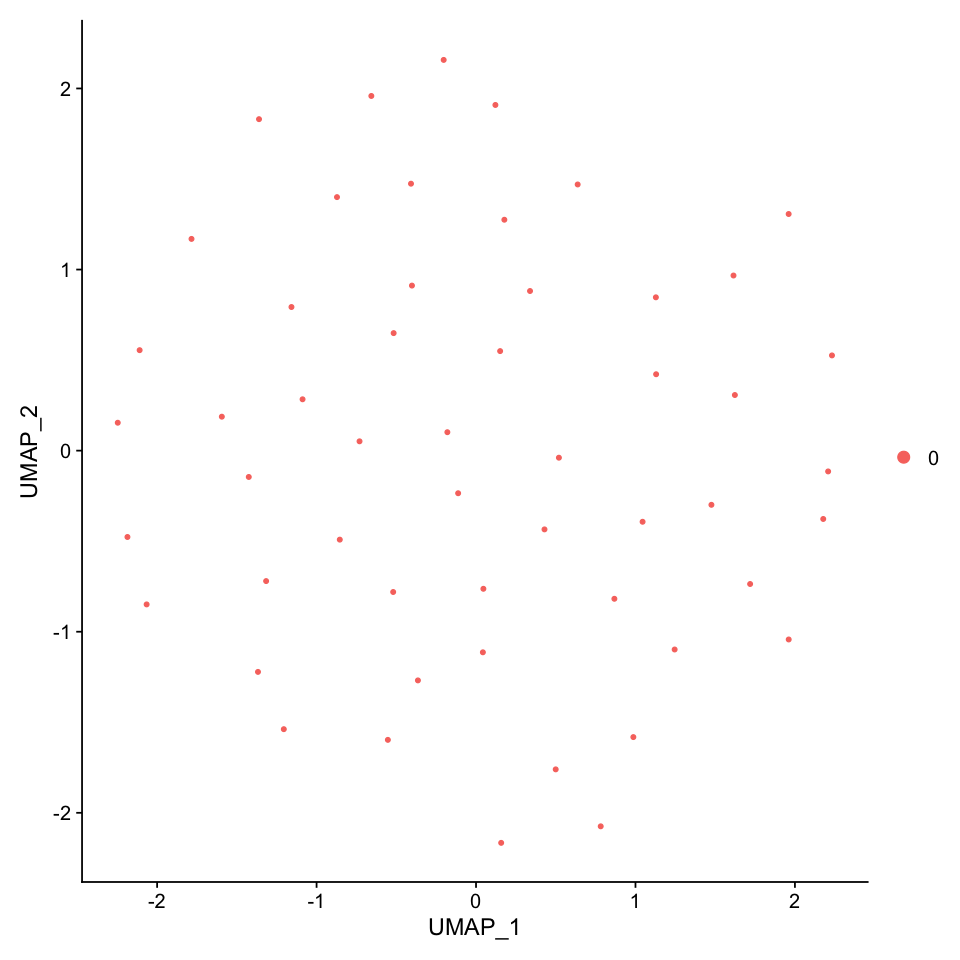

In [41]:
options(repr.plot.width=8, repr.plot.height=8)
seu.meso.gcm <- RunPCA(seu.meso.gcm)
seu.meso.gcm <- RunUMAP(seu.meso.gcm, dims = 1:30)
seu.meso.gcm <- FindNeighbors(seu.meso.gcm, dims = 1:30)
seu.meso.gcm <- FindClusters(seu.meso.gcm)
DimPlot(seu.meso.gcm, reduction = 'umap')

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 53
Number of edges: 1378

Running Louvain algorithm...
Maximum modularity in 10 random starts: -0.0027
Number of communities: 7
Elapsed time: 0 seconds


1 singletons identified. 6 final clusters.



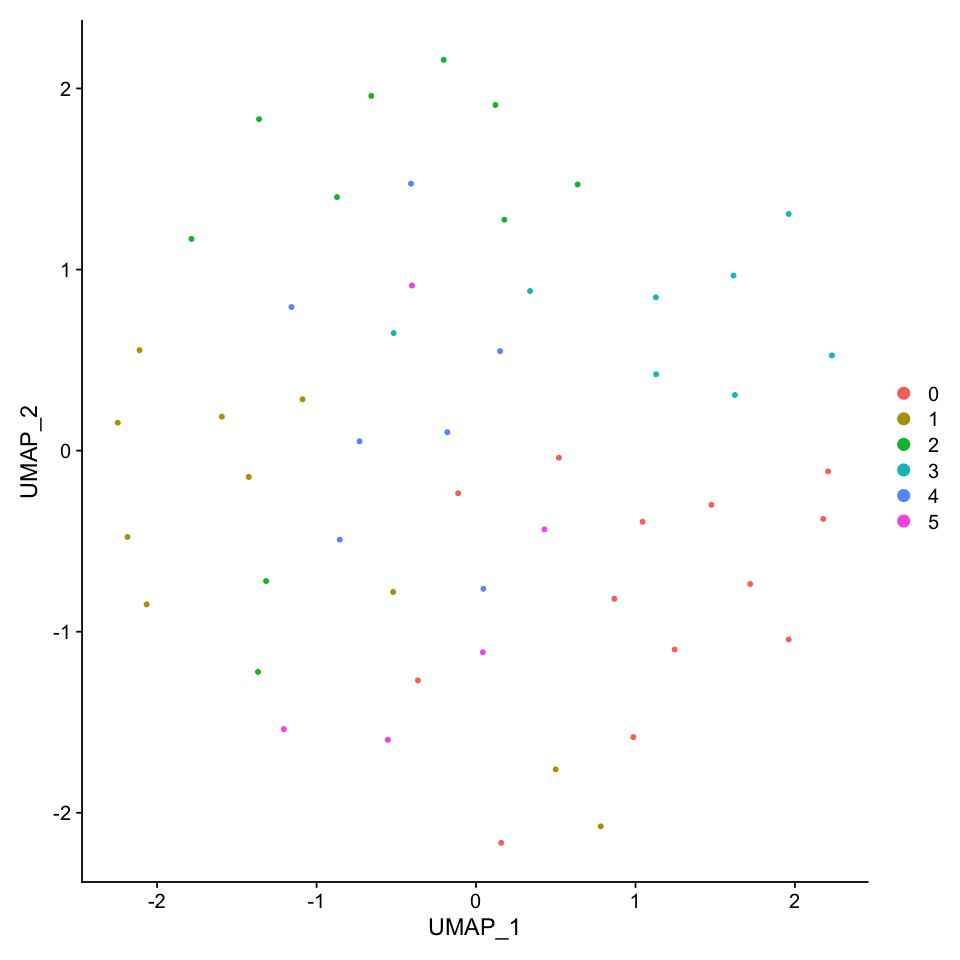

In [42]:
seu.meso.gcm <- FindClusters(seu.meso.gcm, resolution = 1.1)
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.meso.gcm, reduction = 'umap')

In [43]:
all.markers <- FindAllMarkers(object = seu.meso.gcm, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5



[1] 529

[1] 61

Warning message in DoHeatmap(seu.meso.gcm, features = c("Dfd", "ttk", all.markers.top10$gene)):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: Sec8, BCL7-like, CG18787, MICU1, agt, Rbpn-5, CG11560, CG31855, spas, CG7049, PH4alphaEFB, Sc2, Arl5, SelG, CG3500, CG4743, Sin, Rpn11, arx, CG5516, mRpS6, mRpS18B, Hmu”


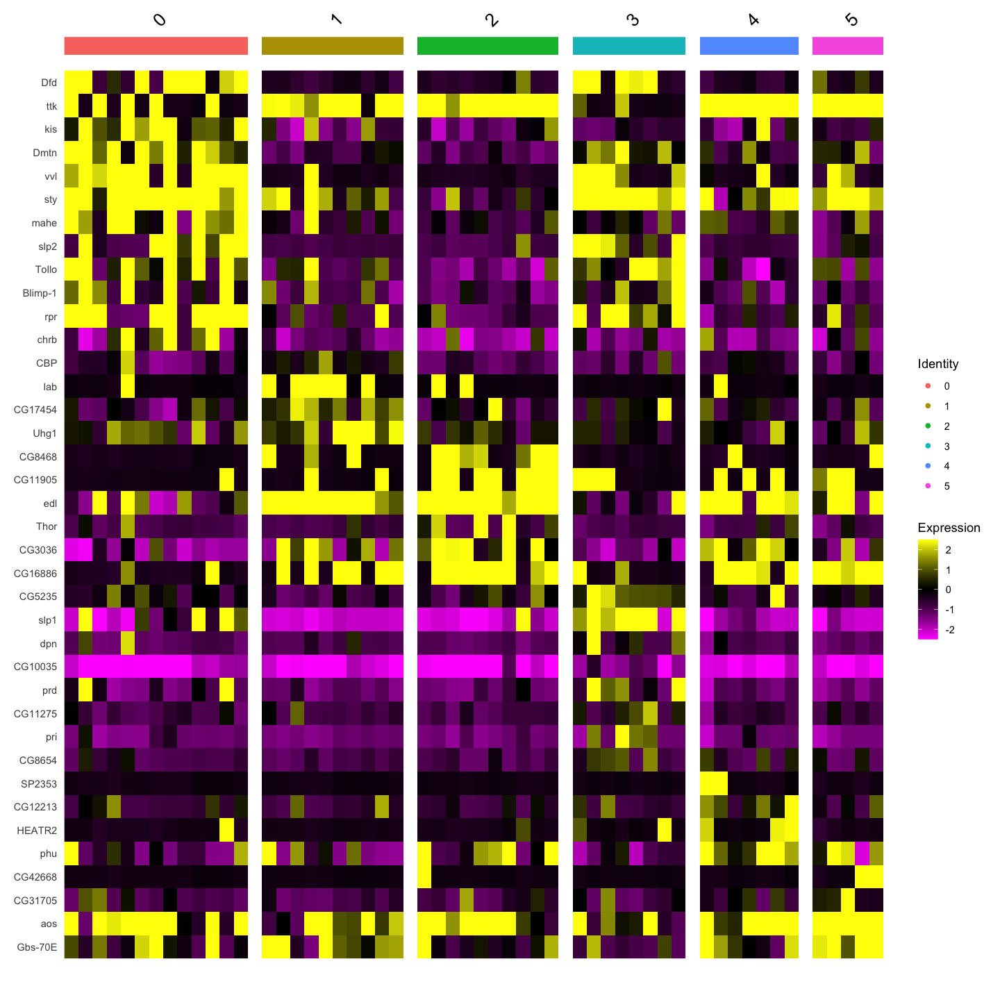

In [44]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.meso.gcm, features = c("Dfd","ttk",all.markers.top10$gene))

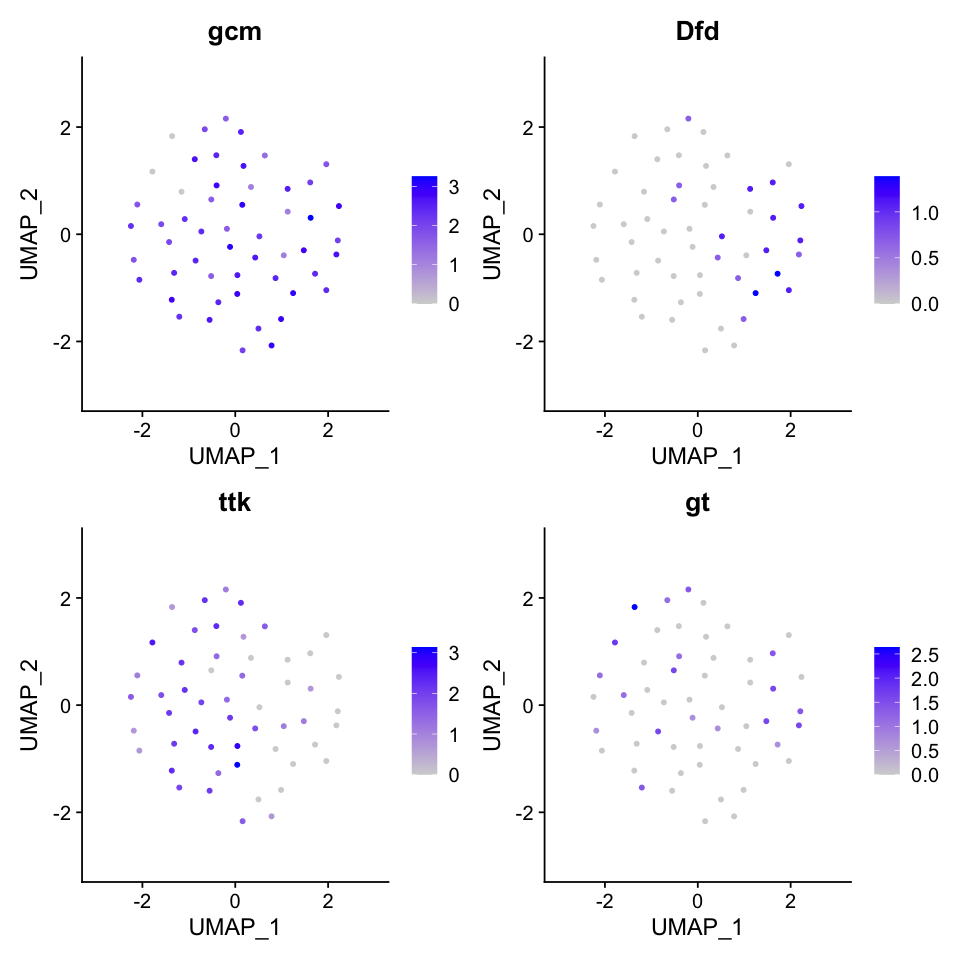

In [45]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.meso.gcm, features = c('gcm','Dfd','ttk','gt'))

In [46]:
seu.meso.gcm$manual_ID <- 'mesoderm_gcm'

## Anterior Midgut
### picking up target clusters

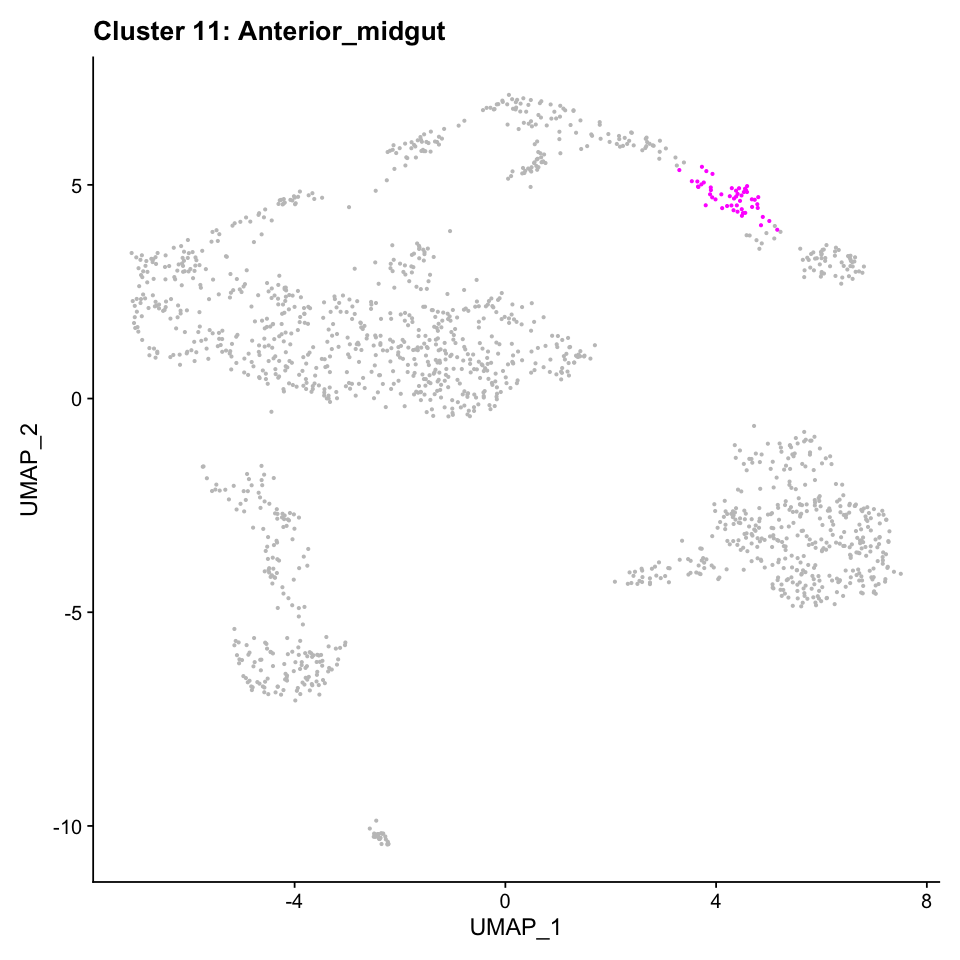

In [47]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(11))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Cluster 11: Anterior_midgut')

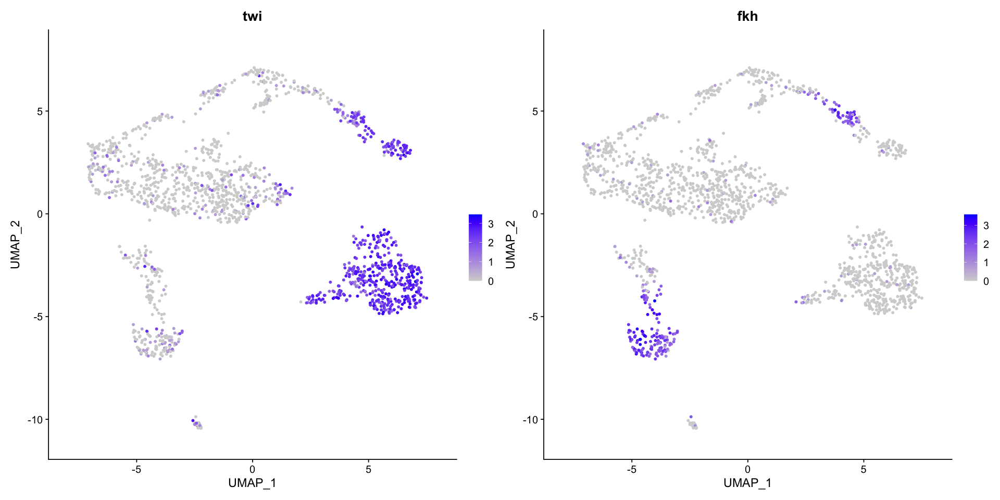

In [48]:
options(repr.plot.width=16, repr.plot.height=8)
FeaturePlot(seu_HQC, reduction = 'umap', features = c('twi', 'fkh'))

In [49]:
seu.ant <- subset(seu_HQC, ident = c(11))
seu.ant

An object of class Seurat 
24184 features across 51 samples within 2 assays 
Active assay: SCT (10063 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### Clustering
Num of cells < 500  
Skipping re-normalize

Warning message in irlba(A = t(x = object), nv = npcs, ...):
“You're computing too large a percentage of total singular values, use a standard svd instead.”
PC_ 1 
Positive:  ImpE2, knrl, hkb, mirr, fkh, kni, CG31038, rib, CG3502, Hsp83 
	   Ldh, edl, ltl, Aldh, mtt, CG14427, srp, Mdr49, DNaseII, croc 
	   bun, Alp1, Optix, Sec61beta, VepD, Myc, Ilp4, amd, CG16758, CG17119 
Negative:  Cys, Dl, CG13427, SoxN, Lac, Tom, CG34224, ImpL2, h, BobA 
	   lncRNA:bxd, slp1, dan, ftz, tsh, Atx-1, Antp, sog, ths, Ptr 
	   run, CG43355-sala, phu, CG15628, opa, CG14915, net, kek1, fz2, CG10035 
PC_ 2 
Positive:  odd, drm, amd, fd102C, tra, fj, tsg, ab, E(spl)m4-BFM, Tom 
	   p38c, Brd, E(spl)m7-HLH, CG14427, CG42342, fkh, CG13427, Ldh, CG11905, wg 
	   ImpE2, E(spl)m5-HLH, BobA, CenG1A, hkb, cnc, Ocho, CG3502, Cpr73D, CG31809 
Negative:  Ilp4, Optix, Mes2, CG12177, stg, CG3036, twi, CG33099, CG14688, stumps 
	   Alp1, sna, hll, CG7029, chrb, zfh1, Act87E, VepD, edl, bun 
	   CG8260, Graf, cv-c, sty,

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 51
Number of edges: 1275

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.2000
Number of communities: 1
Elapsed time: 0 seconds


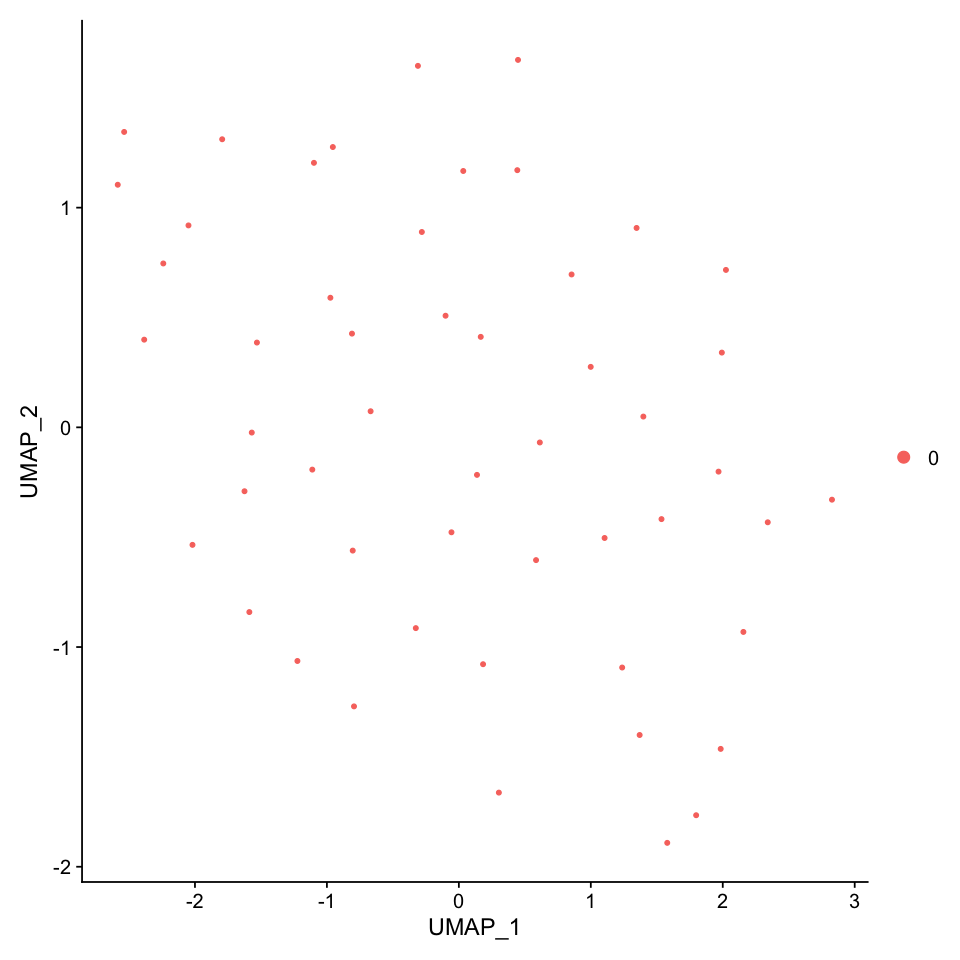

In [50]:
options(repr.plot.width=8, repr.plot.height=8)
seu.ant <- RunPCA(seu.ant, npc=30)
seu.ant <- RunUMAP(seu.ant, dims = 1:30)
seu.ant <- FindNeighbors(seu.ant, dims = 1:30)
seu.ant <- FindClusters(seu.ant)
DimPlot(seu.ant, reduction = 'umap')

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 51
Number of edges: 1275

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.0254
Number of communities: 3
Elapsed time: 0 seconds


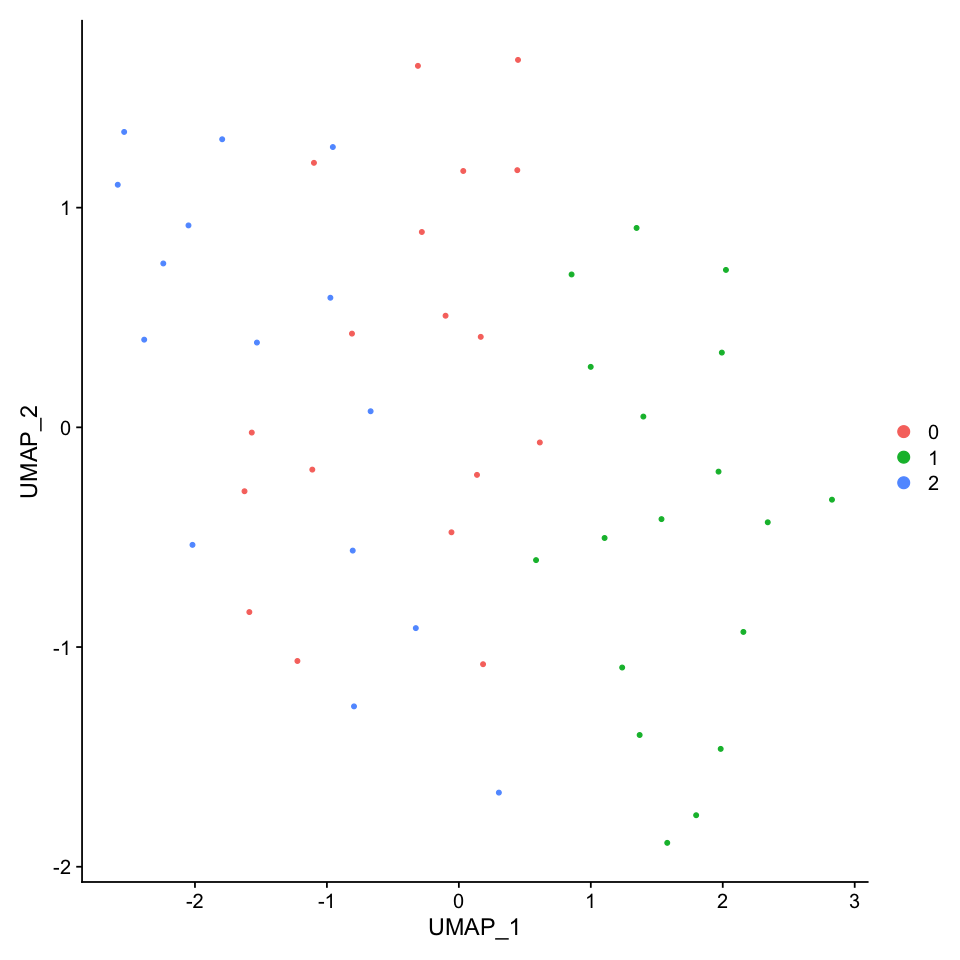

In [51]:
seu.ant <- FindClusters(seu.ant, resolution = 1.0)
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.ant, reduction = 'umap')

In [52]:
levels(seu.ant) <- c(2,0,1)
all.markers <- FindAllMarkers(object = seu.ant, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 2

Calculating cluster 0

Calculating cluster 1



[1] 229

[1] 30

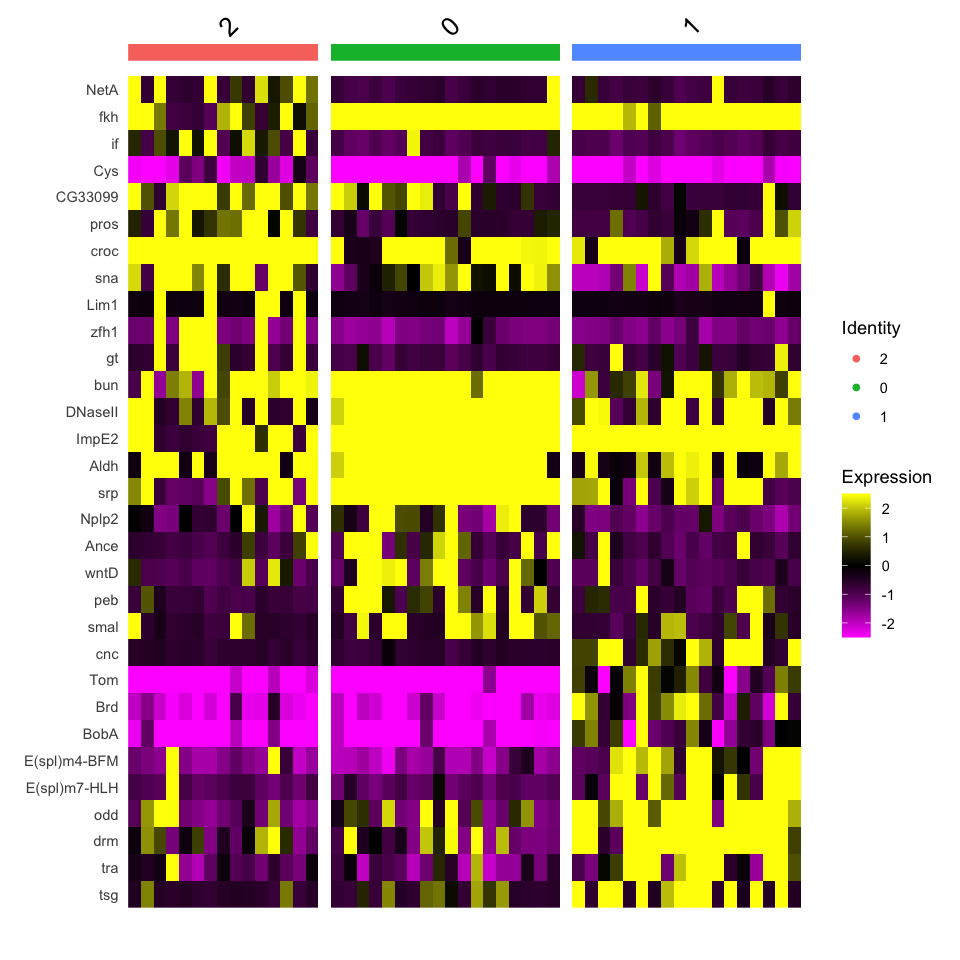

In [53]:
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu.ant, features = c('NetA','fkh',all.markers.top10$gene))

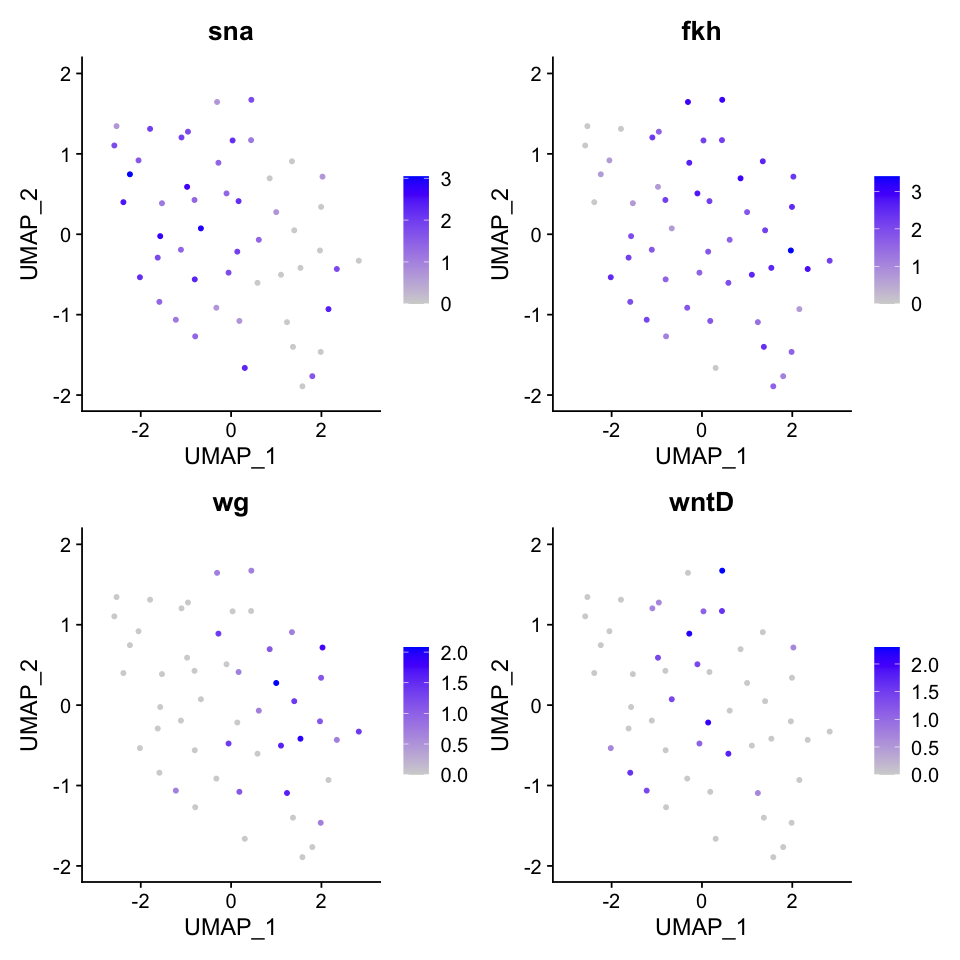

In [54]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.ant, features = c('sna','fkh','wg','wntD'))

,manual_ID
,<fct>
GSM2494786_TTCTTGACGTTT,0
GSM2494786_CCCCTCGAAGAN,1
GSM2494786_TAGTGTCTGTTC,1
GSM2494786_TGACGGGAAATC,1
GSM2494786_ATTCTCTTTTTG,1
GSM2494786_TTCCGCATGTCG,2


,manual_ID
,<fct>
GSM2494786_TTCTTGACGTTT,endoderm_antMG_wntD
GSM2494786_CCCCTCGAAGAN,endoderm_antMG_wg
GSM2494786_TAGTGTCTGTTC,endoderm_antMG_wg
GSM2494786_TGACGGGAAATC,endoderm_antMG_wg
GSM2494786_ATTCTCTTTTTG,endoderm_antMG_wg
GSM2494786_TTCCGCATGTCG,endoderm_antMG_wntD


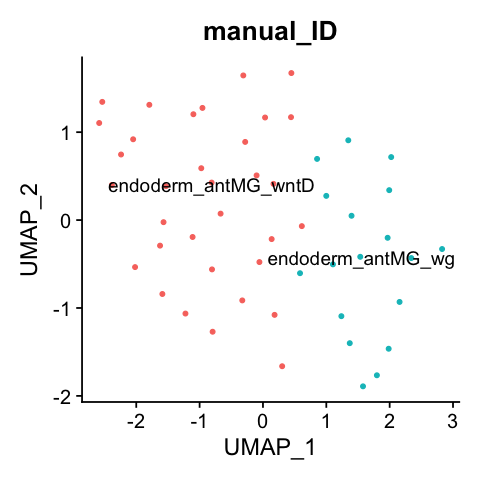

In [55]:
manual_id <- as.data.frame(seu.ant$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)
manual_id$manual_ID <- dplyr::recode(manual_id$manual_ID, 
                                "1" = "endoderm_antMG_wg",#fkh+, sna+
                                "0" = "endoderm_antMG_wntD",#fkh+, sna-
                                "2" = "endoderm_antMG_wntD" #fkh+, sna-
                                )
head(manual_id)
seu.ant$manual_ID <- manual_id
options(repr.plot.width=4, repr.plot.height=4)
DimPlot(seu.ant, reduction = 'umap', label = T, group.by = 'manual_ID') + NoLegend() 

In [56]:
Idents(seu.ant) <- 'manual_ID'
all.markers <- FindAllMarkers(object = seu.ant, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster endoderm_antMG_wntD

Calculating cluster endoderm_antMG_wg



[1] 168

[1] 20

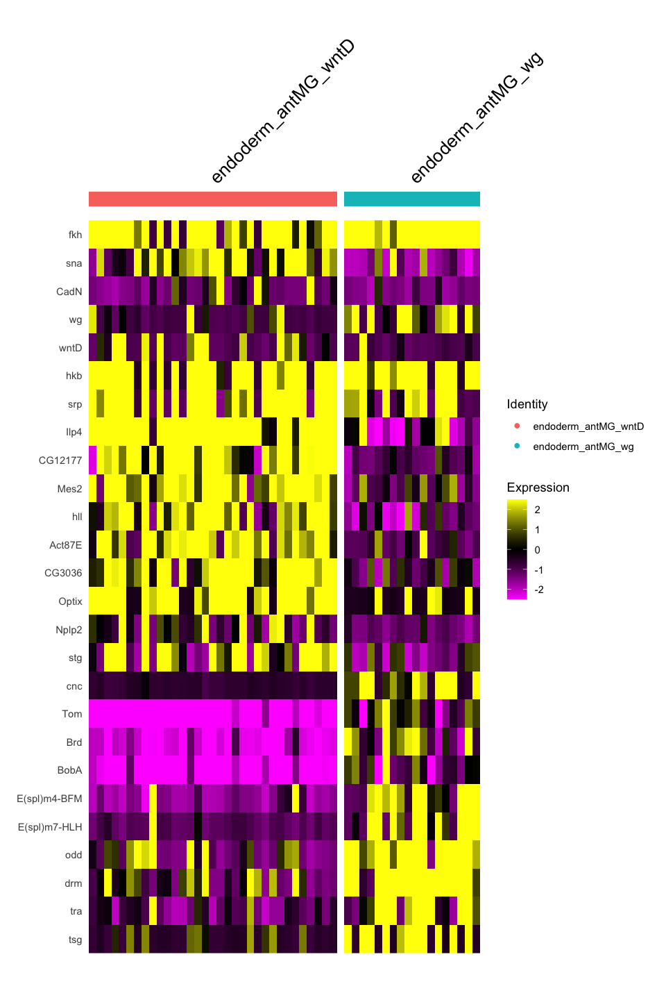

In [57]:
options(repr.plot.width=8, repr.plot.height=12)
DoHeatmap(seu.ant, features = c('fkh','sna','CadN','wg','wntD','hkb','srp',all.markers.top10$gene))

Saving 7 x 7 in image



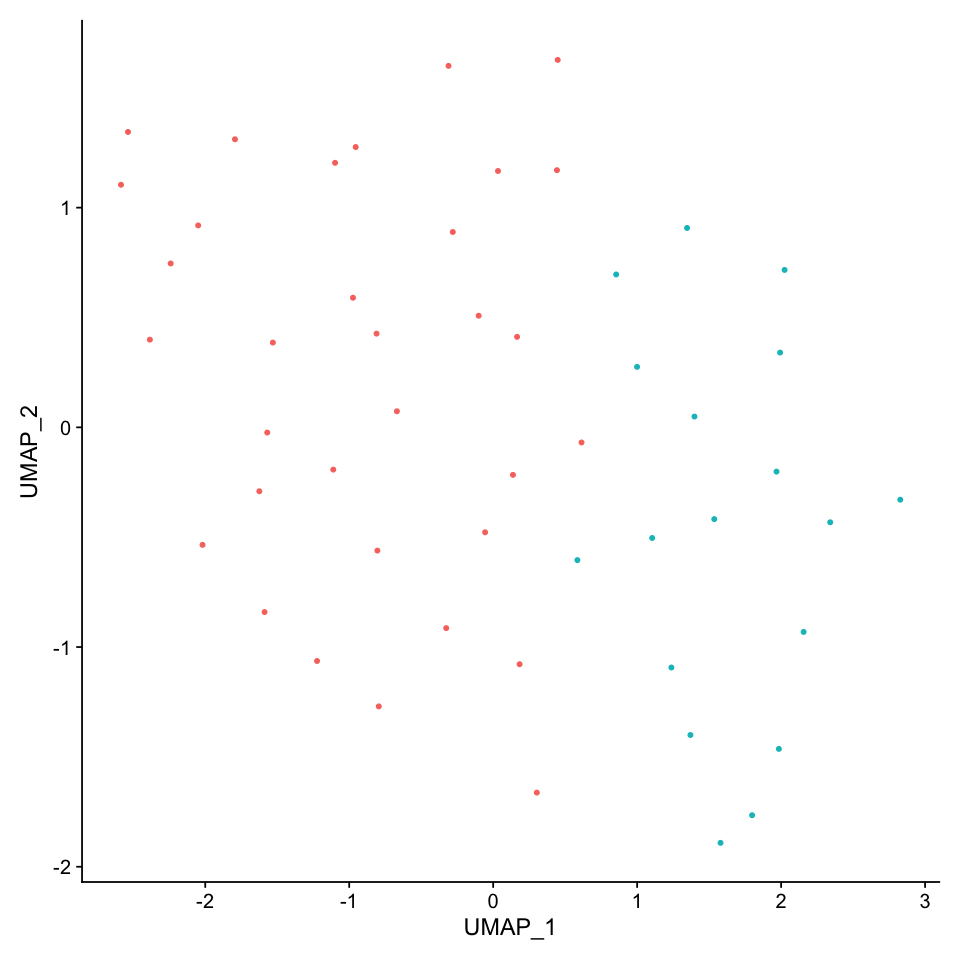

In [58]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.ant, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/04_mesoderm_subclustering_NK/ant_MG_umap1.eps", dpi = 300)

Saving 7 x 7 in image



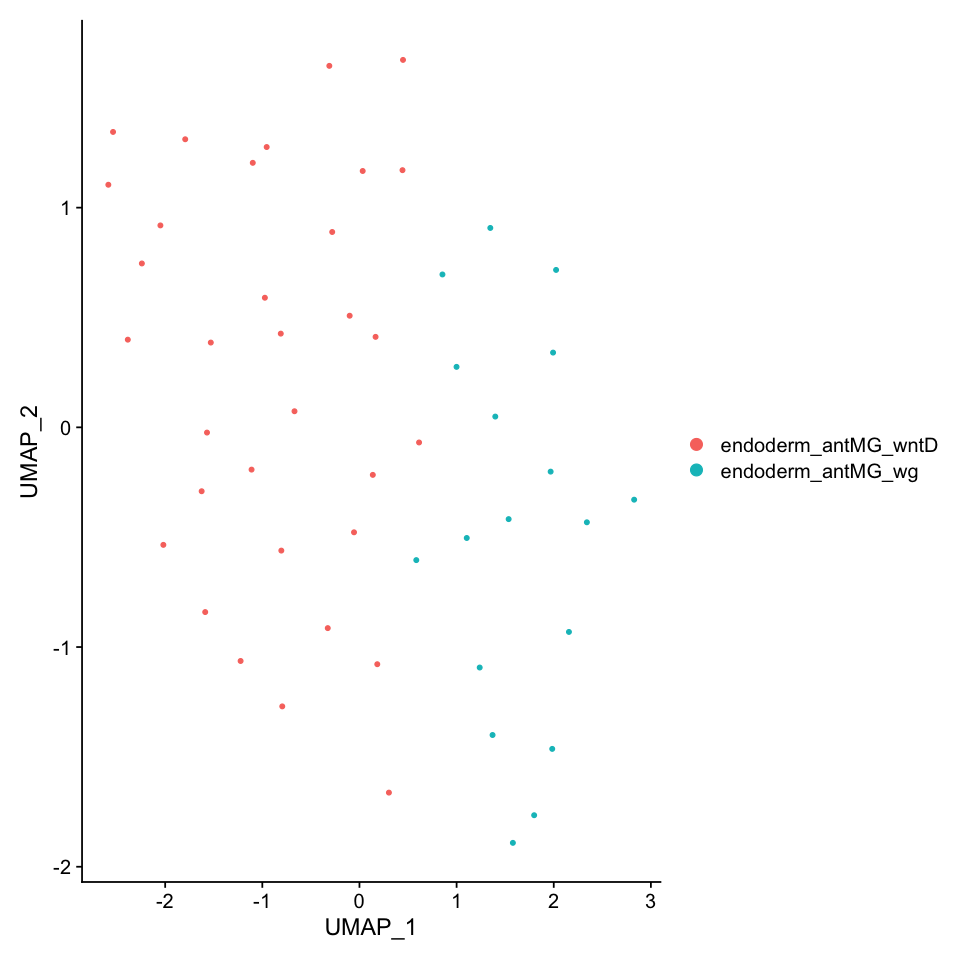

In [59]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.ant, reduction =  "umap", label = FALSE)

fig
ggsave(fig, file = "./figures/04_mesoderm_subclustering_NK/ant_MG_umap2.eps", dpi = 300)

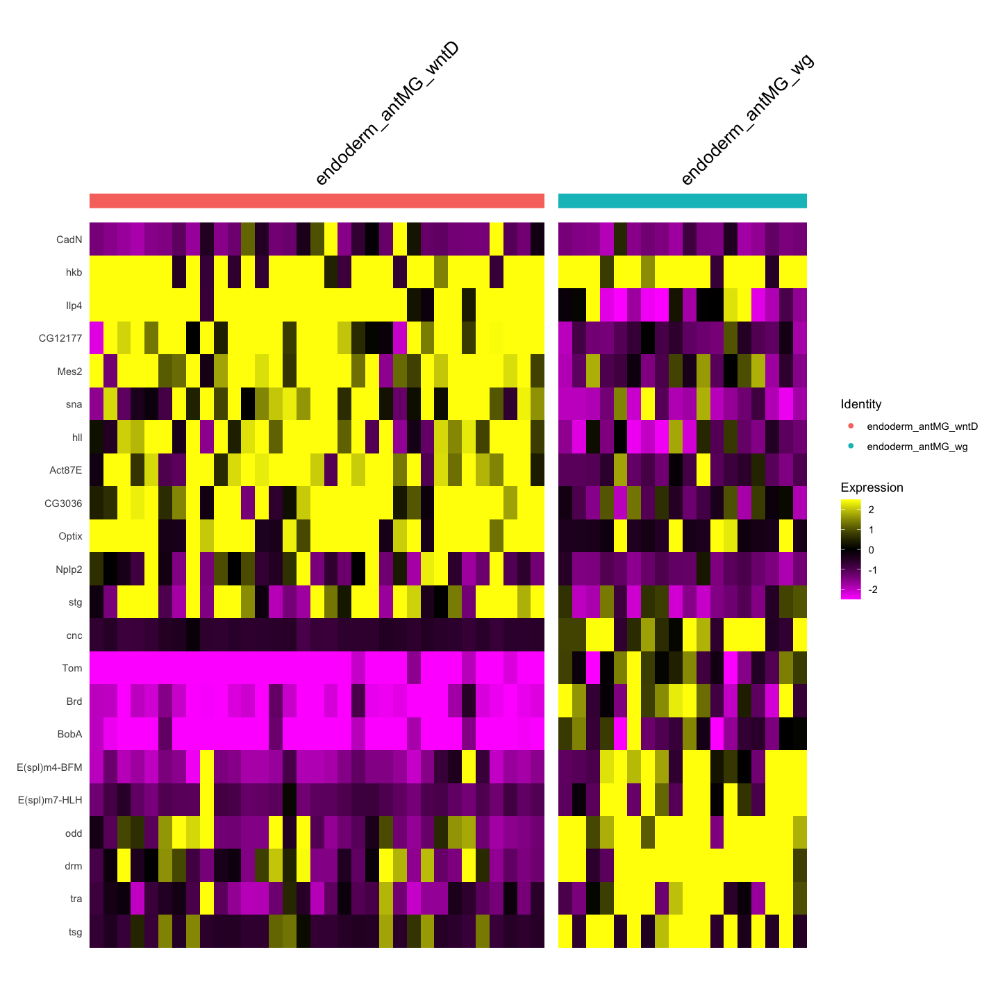

In [60]:
options(repr.plot.width=12, repr.plot.height=12)
fig <- DoHeatmap(seu.ant, features = c('CadN','hkb',all.markers.top10$gene))
fig
ggsave(fig, file = "./figures/04_mesoderm_subclustering_NK/ant_MG_manualID_heatmap.eps", dpi = 300,  width = 12, height = 8)

## Mesoderm PS1–3
### picking up target clusters

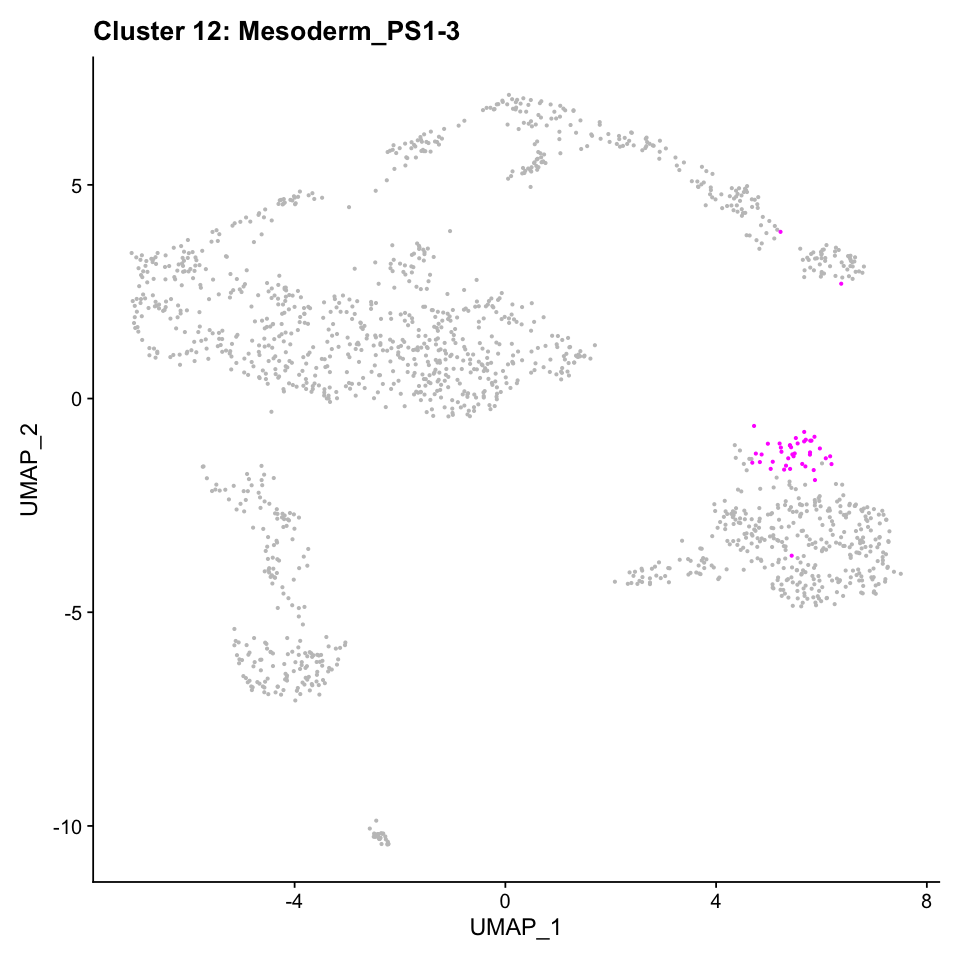

In [61]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(12))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Cluster 12: Mesoderm_PS1-3')

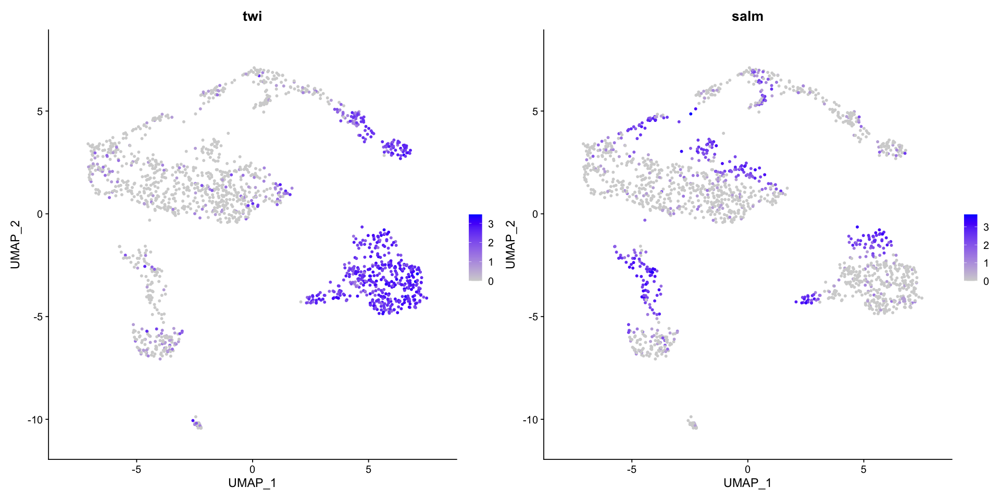

In [62]:
options(repr.plot.width=16, repr.plot.height=8)
FeaturePlot(seu_HQC, reduction = 'umap', features = c('twi', 'salm'))

In [63]:
seu.ps1.to.ps3 <- subset(seu_HQC, ident = c(12))
seu.ps1.to.ps3

An object of class Seurat 
24184 features across 42 samples within 2 assays 
Active assay: SCT (10063 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### Clustering
Num of cells < 500  
Skipping re-normalize

Warning message in irlba(A = t(x = object), nv = npcs, ...):
“You're computing too large a percentage of total singular values, use a standard svd instead.”
PC_ 1 
Positive:  CG13427, Lac, CG34224, Tom, Atx-1, lncRNA:bxd, Brd, BobA, ths, Antp 
	   Ptr, SoxN, kek1, grh, aop, cv-2, tsh, E(spl)m4-BFM, 5-HT2A, phu 
	   ASPP, Dl, Ubx, CG4440, CG10035, bib, Doc1, Ppa, rho, sdt 
Negative:  CG43355-sala, Ilp4, salm, zfh1, NetB, twi, hll, VepD, sty, CG14688 
	   htl, Mes2, CadN, Cyp310a1, wntD, sna, ltl, Fur1, CG12177, grim 
	   edl, pigs, if, rpr, Dfd, CG33099, Myc, babos, sprt, stg 
PC_ 2 
Positive:  Dfd, rib, ham, px, CrebA, Imp-CR45204, Dl, Blimp-1, CHES-1-like, CG11180 
	   vvl, hid, knrl, RhoGAP71E, cnn, rdx, spen, Fur1, Dmtn, CG3638 
	   asRNA:CR45874, gt, Sdc, CG2865, Ndae1, sbb, Mef2, asRNA:CR46070, gcm, pigs 
Negative:  CG4702, wntD, trn, ftz, pyd3, Pka-C3, lncRNA:CR43887, ken, babos, lncRNA:CR44931 
	   Desat1, Nplp2, SNCF, CG6398, Cys, CG16758, CG8960, rst, Ilp4, hll 
	   CG14915, C

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 42
Number of edges: 861

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.2000
Number of communities: 1
Elapsed time: 0 seconds


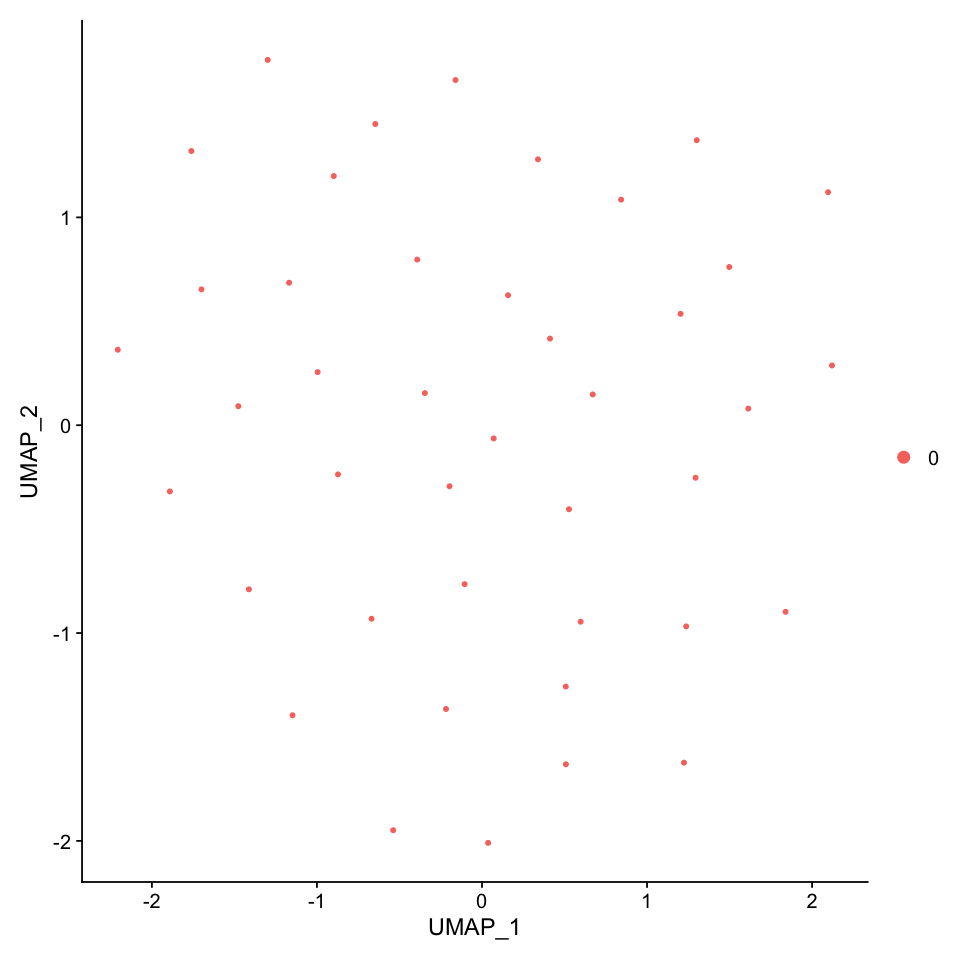

In [64]:
options(repr.plot.width=8, repr.plot.height=8)
seu.ps1.to.ps3 <- RunPCA(seu.ps1.to.ps3, npc=30)
seu.ps1.to.ps3 <- RunUMAP(seu.ps1.to.ps3, dims = 1:30)
seu.ps1.to.ps3 <- FindNeighbors(seu.ps1.to.ps3, dims = 1:30)
seu.ps1.to.ps3 <- FindClusters(seu.ps1.to.ps3)
DimPlot(seu.ps1.to.ps3, reduction = 'umap')

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 42
Number of edges: 861

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.0061
Number of communities: 2
Elapsed time: 0 seconds


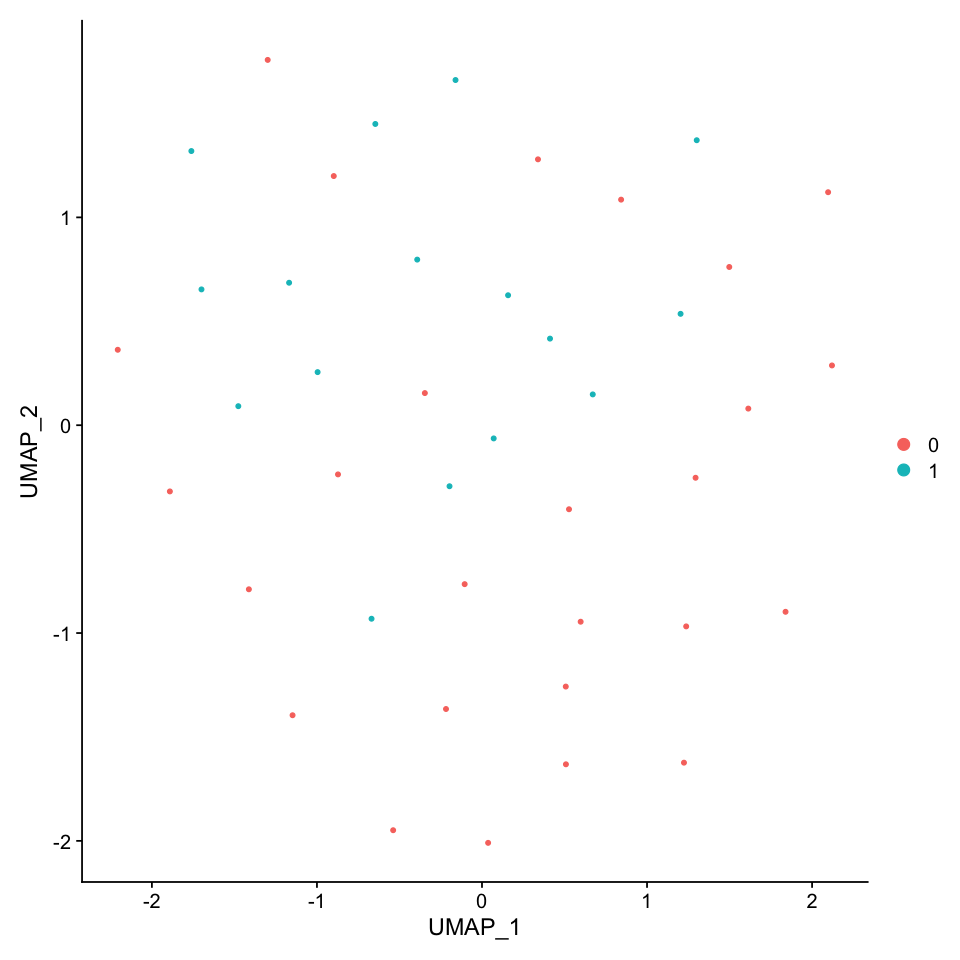

In [65]:
options(repr.plot.width=8, repr.plot.height=8)
seu.ps1.to.ps3 <- FindClusters(seu.ps1.to.ps3, resolution = 1.0)
DimPlot(seu.ps1.to.ps3, reduction = 'umap')

In [66]:
all.markers <- FindAllMarkers(object = seu.ps1.to.ps3, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1



[1] 49

[1] 20

Warning message in DoHeatmap(seu.ps1.to.ps3, features = c(all.markers.top10$gene)):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: Usp16-45, Pus1, CG3198, Art4, CG15601, Mgstl, Pi3K68D, CG10465, CG4611, CG2767, ix, vnc-CG42455, rasp”


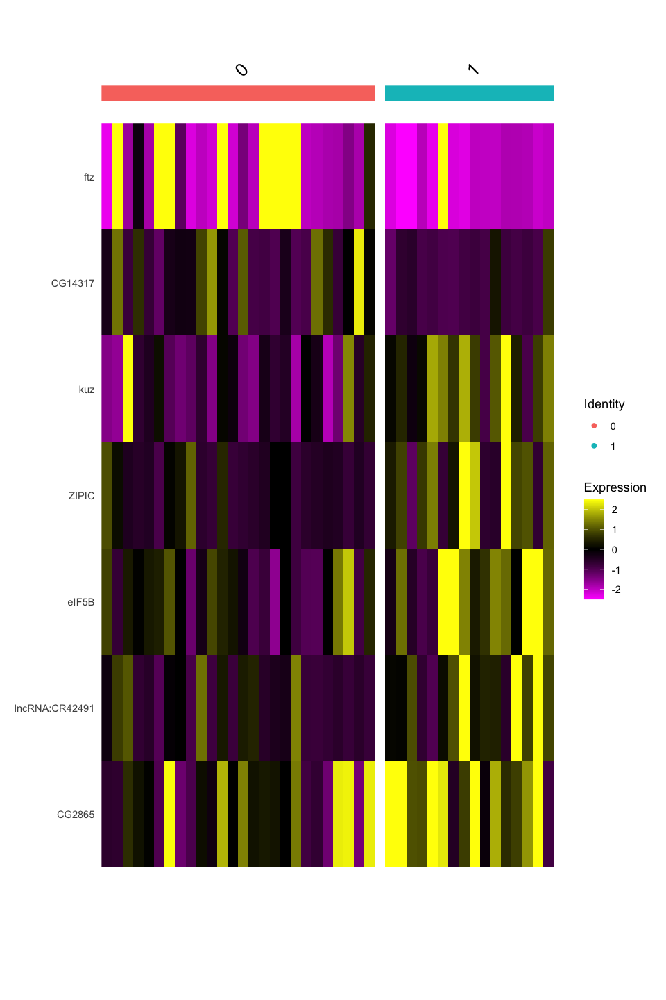

In [67]:
options(repr.plot.width=8, repr.plot.height=12)
DoHeatmap(seu.ps1.to.ps3, features = c(all.markers.top10$gene))

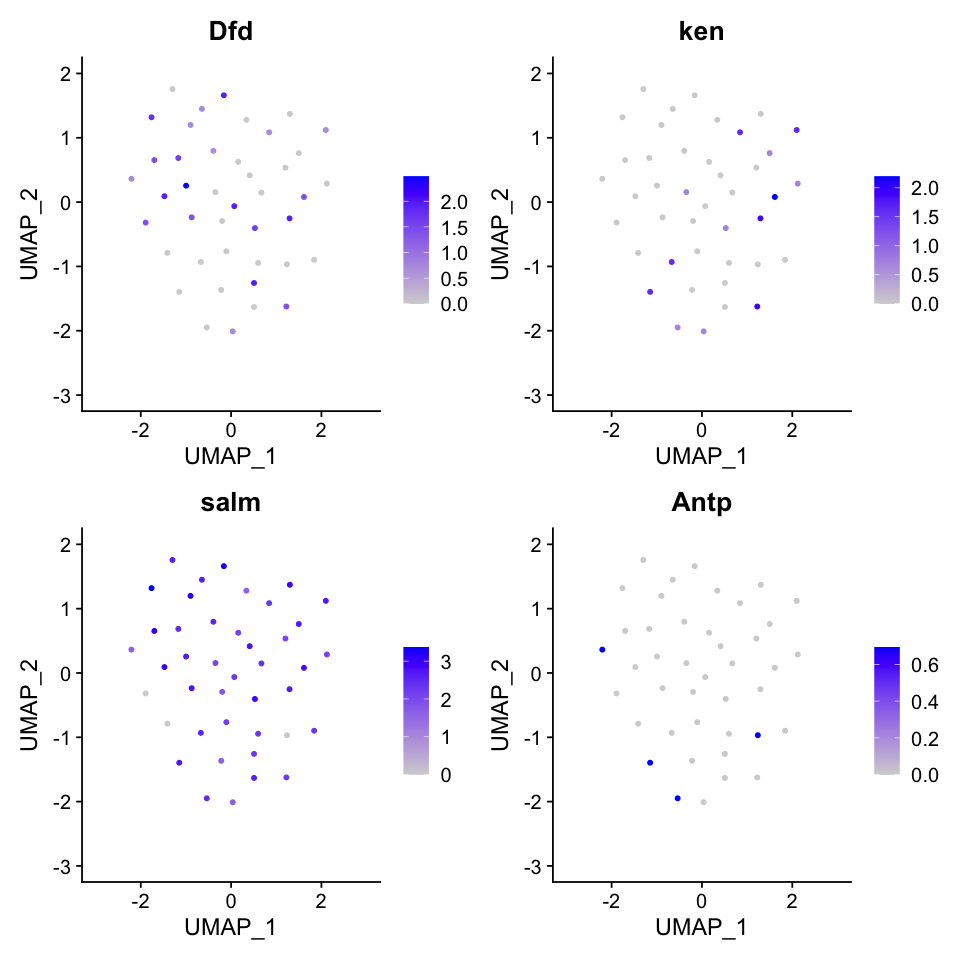

In [68]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.ps1.to.ps3, reduction = 'umap', features = c('Dfd', 'ken', 'salm', 'Antp'))

In [69]:
seu.ps1.to.ps3$manual_ID <- 'mesoderm_PS1-3'

## Posterior mesoderm
### picking up target clusters

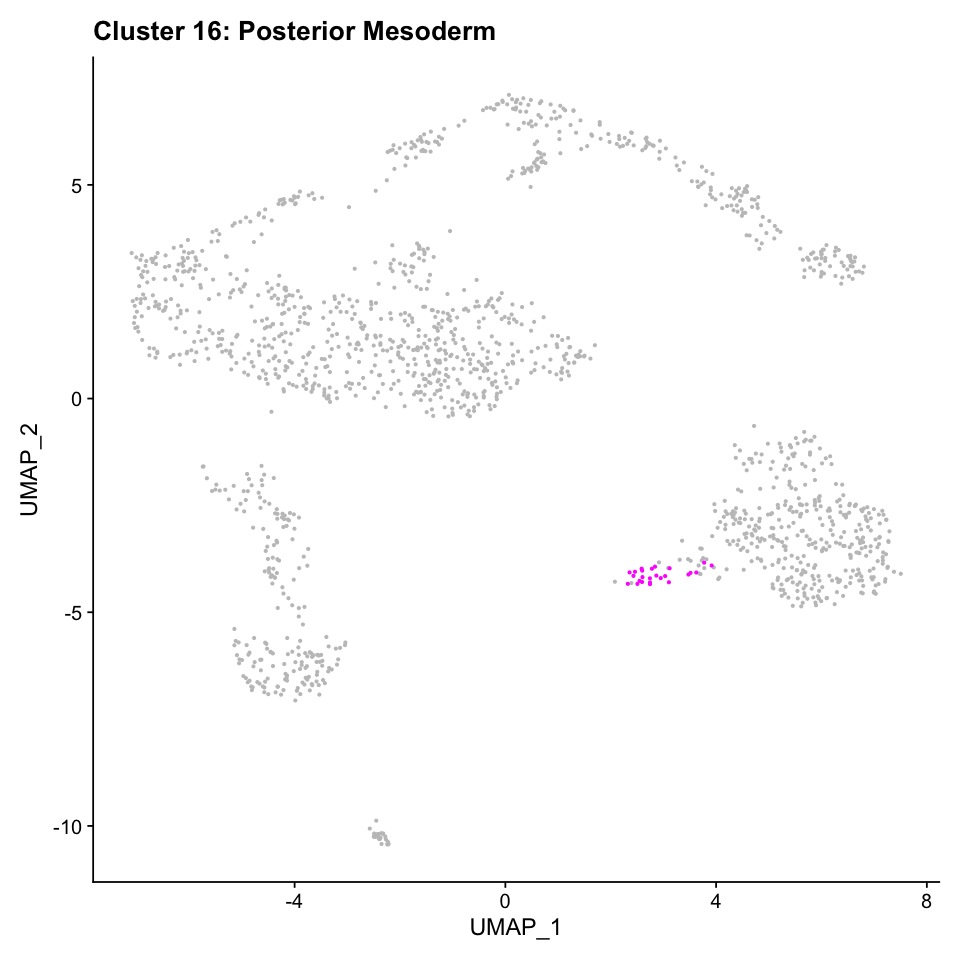

In [70]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(16))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Cluster 16: Posterior Mesoderm')

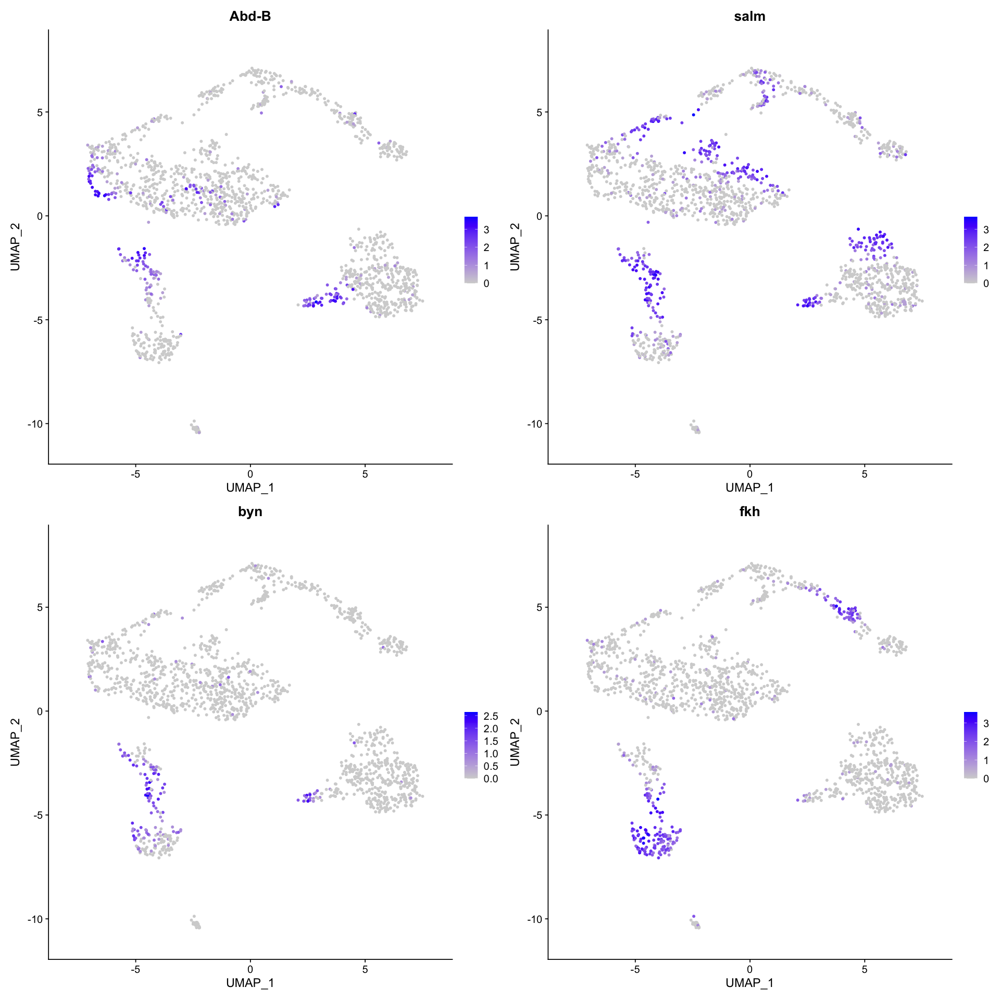

In [71]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = 'umap', features = c('Abd-B', 'salm','byn','fkh'))

In [72]:
seu.post <- subset(seu_HQC, ident = c(16))
seu.post

An object of class Seurat 
24184 features across 25 samples within 2 assays 
Active assay: SCT (10063 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### Clustering
Num of cell < 30  
Skipping re-normalize.  
UMAP did not worked well, due to the small cell number.

Warning message in irlba(A = t(x = object), nv = npcs, ...):
“You're computing too large a percentage of total singular values, use a standard svd instead.”
Warning message in irlba(A = t(x = object), nv = npcs, ...):
“did not converge--results might be invalid!; try increasing work or maxit”
PC_ 1 
Positive:  CG13427, Tom, Lac, CG15628, CG34224, CG5059, BobA, Brd, Ilp4, hth 
	   SoxN, Atx-1, slp1, ths, sog, Ptr, cv-2, kek1, sdt, Antp 
	   aop, ASPP, Kr, Ocho, E(spl)m4-BFM, HnRNP-K, rho, aay, lncRNA:bxd, bun 
Negative:  Abd-B, Blimp-1, ken, sna, Mef2, twi, zfh1, CG42762, CG43355-sala, salm 
	   disco, VepD, D, CadN, Ama, rib, ftz, hb, CG14111, SNCF 
	   byn, cad, Nplp2, Mes2, Cyp310a1, chrb, sano, CG13004, CG3036, CG16758 
PC_ 2 
Positive:  hll, ich, run, lncRNA:CR46267, CadN, Cyp310a1, CG9005, lncRNA:CR43617, tkv, FoxL1 
	   if, htl, CG12177, pigs, CG3036, tin, sty, VepD, emc, sano 
	   dan, CG32982, lbk, Mef2, jar, SNCF, CG13004, fz2, opa, hh 
Negative:  dpn, disco, salm, byn, beat-I

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 25
Number of edges: 300

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.2000
Number of communities: 1
Elapsed time: 0 seconds


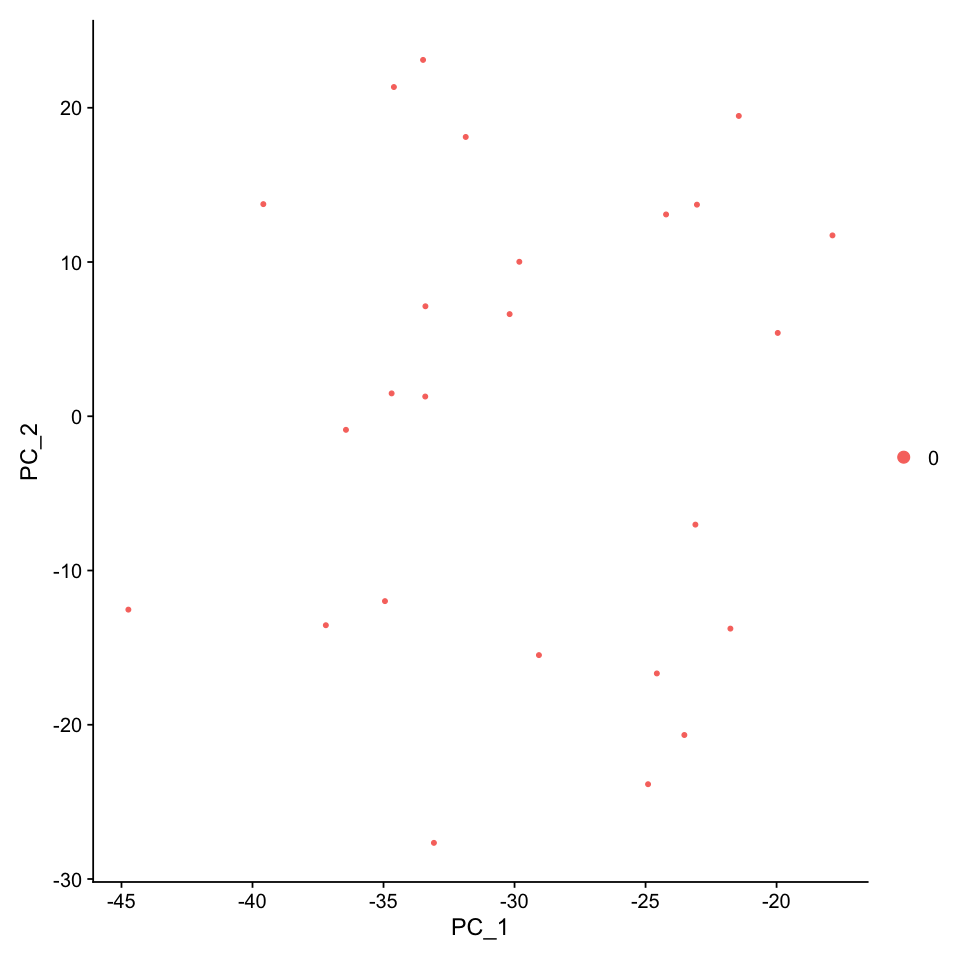

In [73]:
options(repr.plot.width=8, repr.plot.height=8)
seu.post <- RunPCA(seu.post, npc=24)
# seu.post <- RunUMAP(seu.post, dims = 1:30)
seu.post <- FindNeighbors(seu.post, dims = 1:24)
seu.post <- FindClusters(seu.post)
DimPlot(seu.post, reduction = 'pca')

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 25
Number of edges: 300

Running Louvain algorithm...
Maximum modularity in 10 random starts: -0.0373
Number of communities: 7
Elapsed time: 0 seconds


2 singletons identified. 5 final clusters.



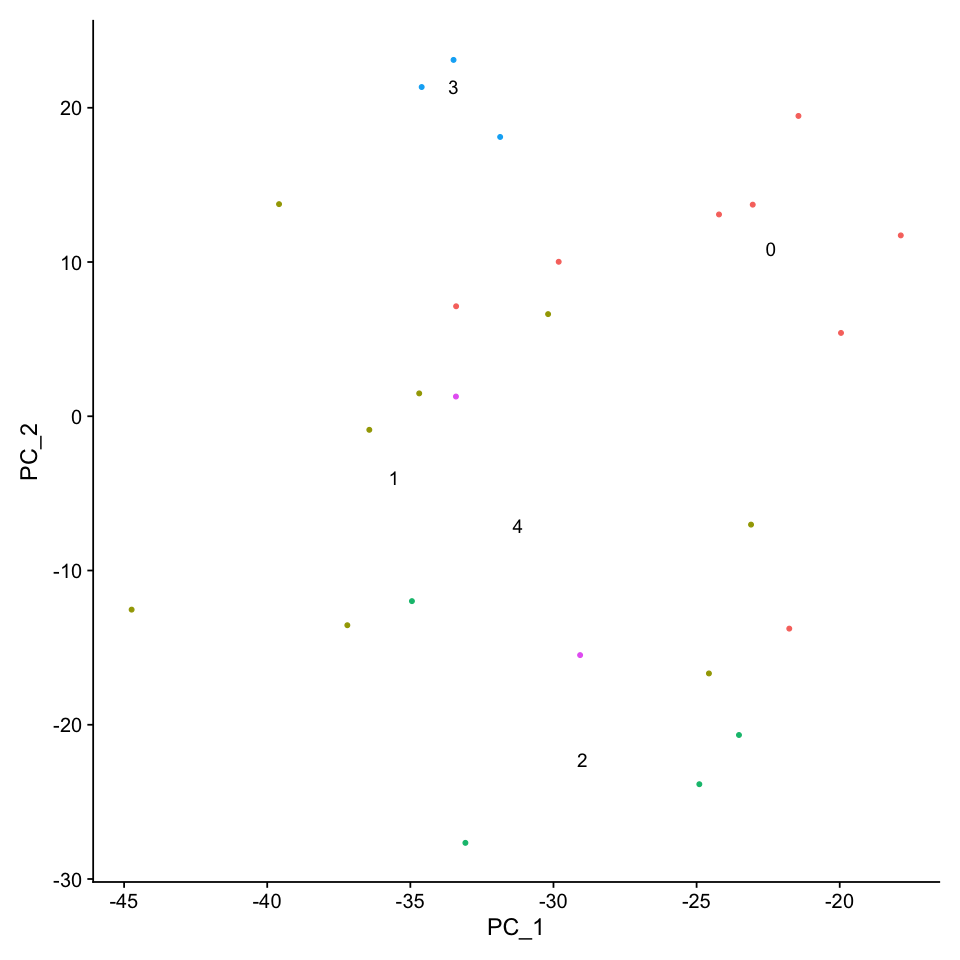

In [74]:
seu.post <- FindClusters(seu.post, resolution = 1.1)
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.post, reduction = 'pca', label = T) + NoLegend()

In [75]:
all.markers <- FindAllMarkers(object = seu.post, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4



[1] 293

[1] 40

Warning message in DoHeatmap(seu.post, features = c(all.markers.top10$gene)):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: CG4538, SRPK, Tudor-SN, MED31, CG2124, Skp2, l(2)35Be, ema, ea, CG3448, CG3792, Gas41, ytr, CG5003, Samtor, CG32069, RPA2, Apf, Rpb11, CG7956”


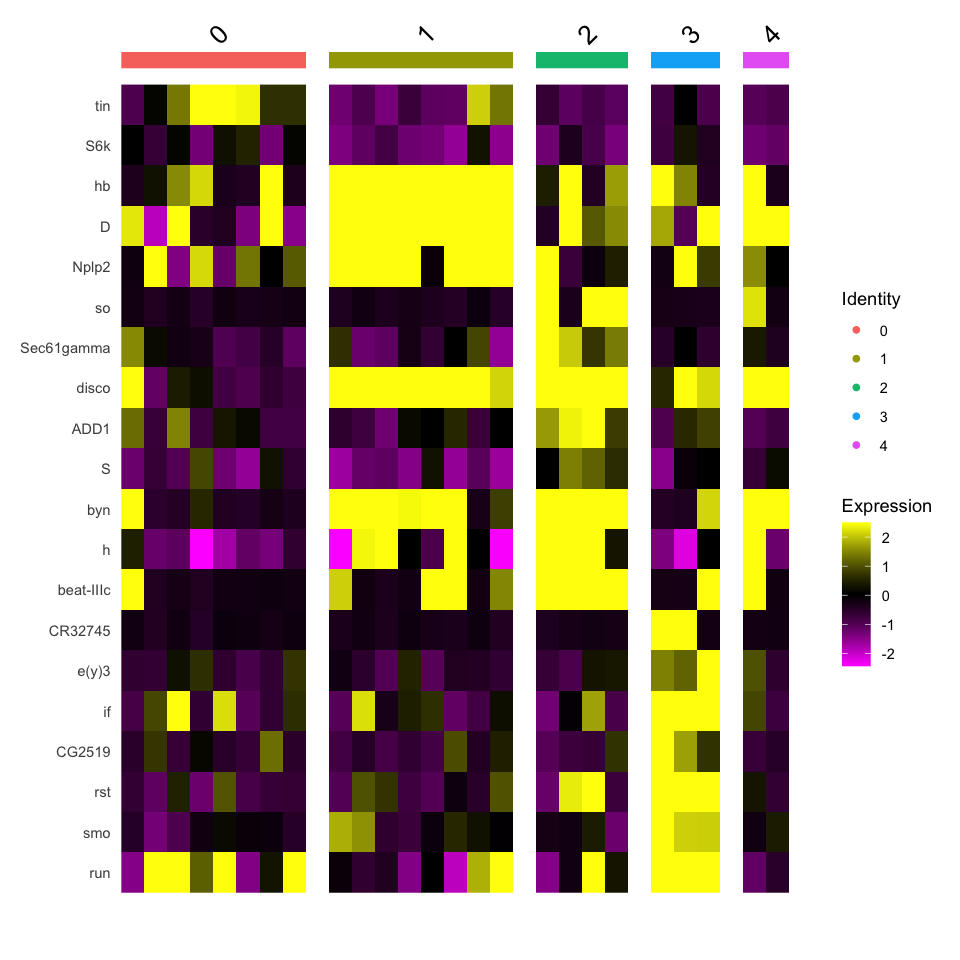

In [76]:
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu.post, features = c(all.markers.top10$gene))

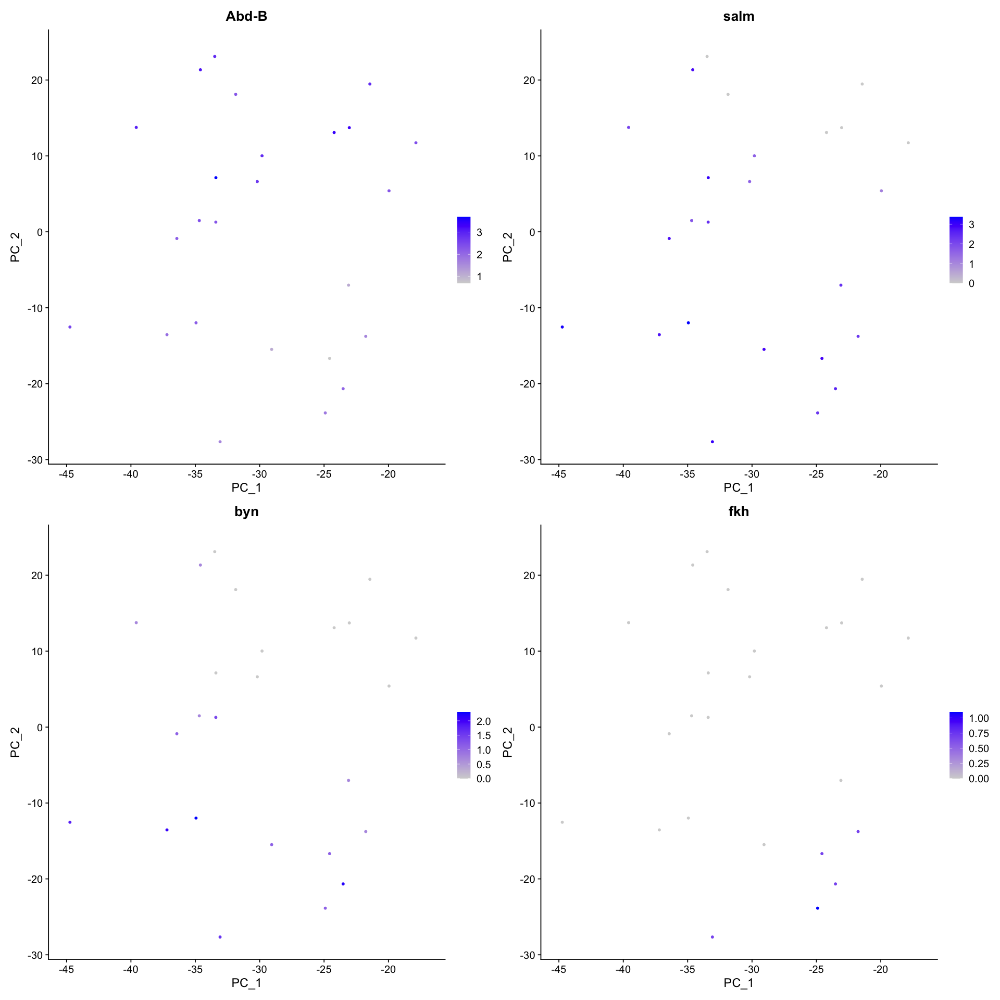

In [77]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.post, reduction = 'pca', features = c('Abd-B', 'salm','byn','fkh'))

In [78]:
seu.post$manual_ID <- 'mesoderm_posterior'

In [79]:
seu.meso.merge <- merge(x = seu.trunk.meso, 
                        y =c(seu.meso.gcm,seu.ant,seu.post,seu.ps1.to.ps3, seu.low.quality, seu.doublet))
seu.others <- subset(seu_HQC, ident = c(0,3,10,11,12,16), invert=TRUE)
seu.others$manual_ID <- 'others'
seu.result <- merge(x=seu.meso.merge, y=seu.others)
seu_HQC$manual_ID <- as.data.frame(seu.result$manual_ID)

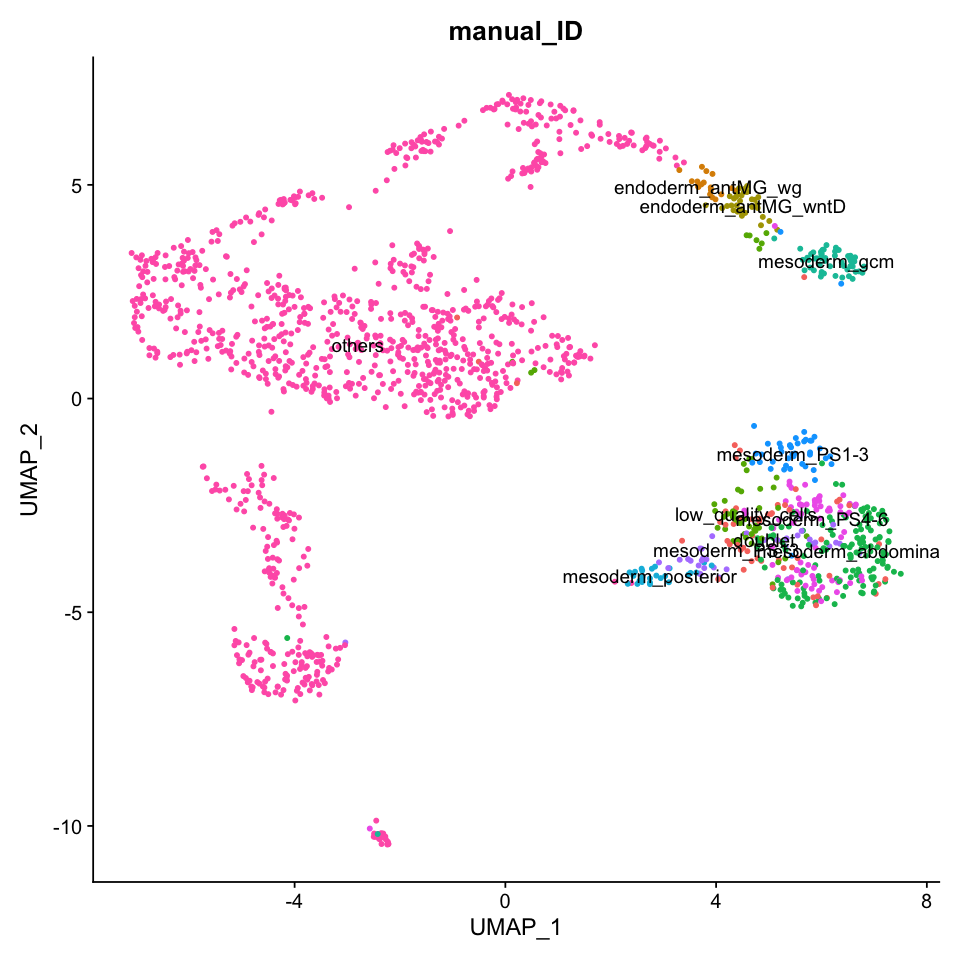

In [80]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC, reduction =  "umap", label = TRUE, group.by = 'manual_ID') + NoLegend()

In [81]:
saveRDS(object = seu.meso.merge, file = '../../data/seurat_object/NK-data/subclustering/seu_mesoderm_subclustering_NK.obj')

In [82]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] tibble_3.0.5      dplyr_1.0.3       Matrix_1.3-2      data.table_1.13.6
[5] magrittr_2.0.1    ggplot2_3.3.3     Seurat_3.2.3     

loaded via a namespace (and not attached):
  [1] nlme_3.1-151          matrixStats_0.57.0    RcppAnnoy_0.0.18     
  [4] RColorBrewer_1.1-2    httr_1.4.2            repr_1.1.0           
  [7] sctransform_0.3.2     tools_4.0.3           R6_2.5.1             
 [10] irlba_2.3.3           rpart_4.1-15          KernSmooth_2.23-18   
 [13] uwot_0.1.10           mgcv